In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
from pandas import DataFrame, Series
import pims

import os

import trackpy as tp
from IPython import display
%matplotlib inline

mpl.rc('figure',  figsize=(12, 12))

# Density Analysis for Supplementary Information
C = 0: green channel, HK. Generally less populated than
C = 1: red channel, Ald.

We are going to look at all videos and try to determine the average density per frame. 

## Step 1: Visual inspection for parameter checking

We are going to look at individual frames to spot the particles and calibrate the parameters

In [2]:
# getting a list of all the base filenames
rootdir = "../stackdata/"
root_filenames = []

for filename in os.listdir(rootdir):
    root_filenames.append(filename.split('_C')[0])
        
root_filenames = sorted(list(set(root_filenames)))

print root_filenames

['BATCH1_XPLGlucose_R1', 'BATCH1_XPLGlucose_R2', 'BATCH1_XPNoGlucose_R1', 'BATCH1_XPNoGlucose_R2', 'BATCH1_XPWithGlucose20X_R1', 'BATCH1_XPWithGlucose_R1', 'BATCH1_XPWithGlucose_R2', 'BATCH1_XPWithGlucose_R3', 'BATCH1_XPWithGlucose_R4', 'BATCH2_XPControl_R1', 'BATCH2_XPControl_R2', 'BATCH2_XP_R1', 'BATCH3_XPDGAtpMgcl2WithHkAld_R1', 'BATCH3_XPDGAtpMgcl2WithHkAld_R2', 'BATCH3_XPDGAtpMgcl2WithHkAld_R3', 'BATCH3_XPGluWithHkAld_R1', 'BATCH3_XPHkWithAld_R1', 'BATCH3_XPHkWithAld_R2', 'BATCH3_XP_R1', 'BATCH3_XP_R2', 'BATCH3_XP_R3']


In [3]:
root_filenames = [rf for rf in root_filenames if rf[:6] == 'BATCH3']

In [5]:
root_filenames

['BATCH3_XPDGAtpMgcl2WithHkAld_R1',
 'BATCH3_XPDGAtpMgcl2WithHkAld_R2',
 'BATCH3_XPDGAtpMgcl2WithHkAld_R3',
 'BATCH3_XPGluWithHkAld_R1',
 'BATCH3_XPHkWithAld_R1',
 'BATCH3_XPHkWithAld_R2',
 'BATCH3_XP_R1',
 'BATCH3_XP_R2',
 'BATCH3_XP_R3']

In [8]:
# our parameters
minmass = 100 # 60 for most, 150 for 20x objective
minsize = 5
separation = 15

processing experiment: BATCH3_XP_R3
frame 0 of 218, channel 0


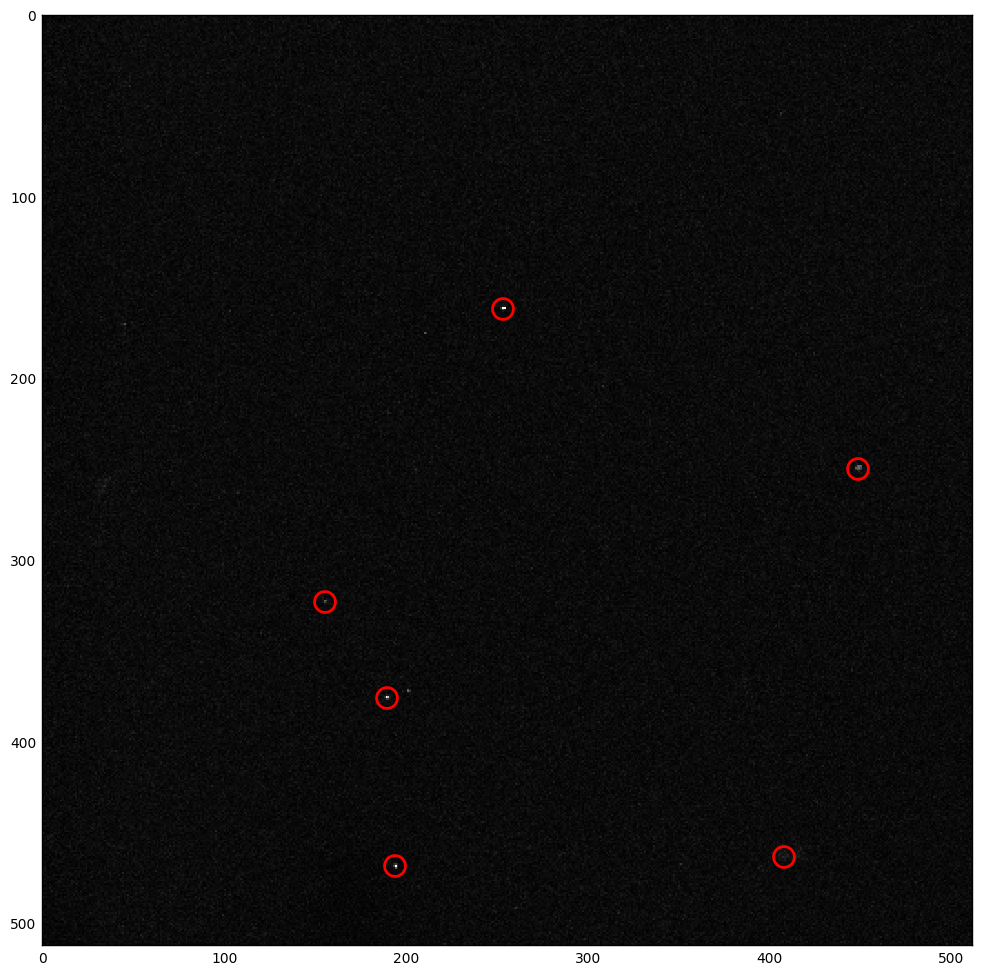

frame 109 of 218, channel 0


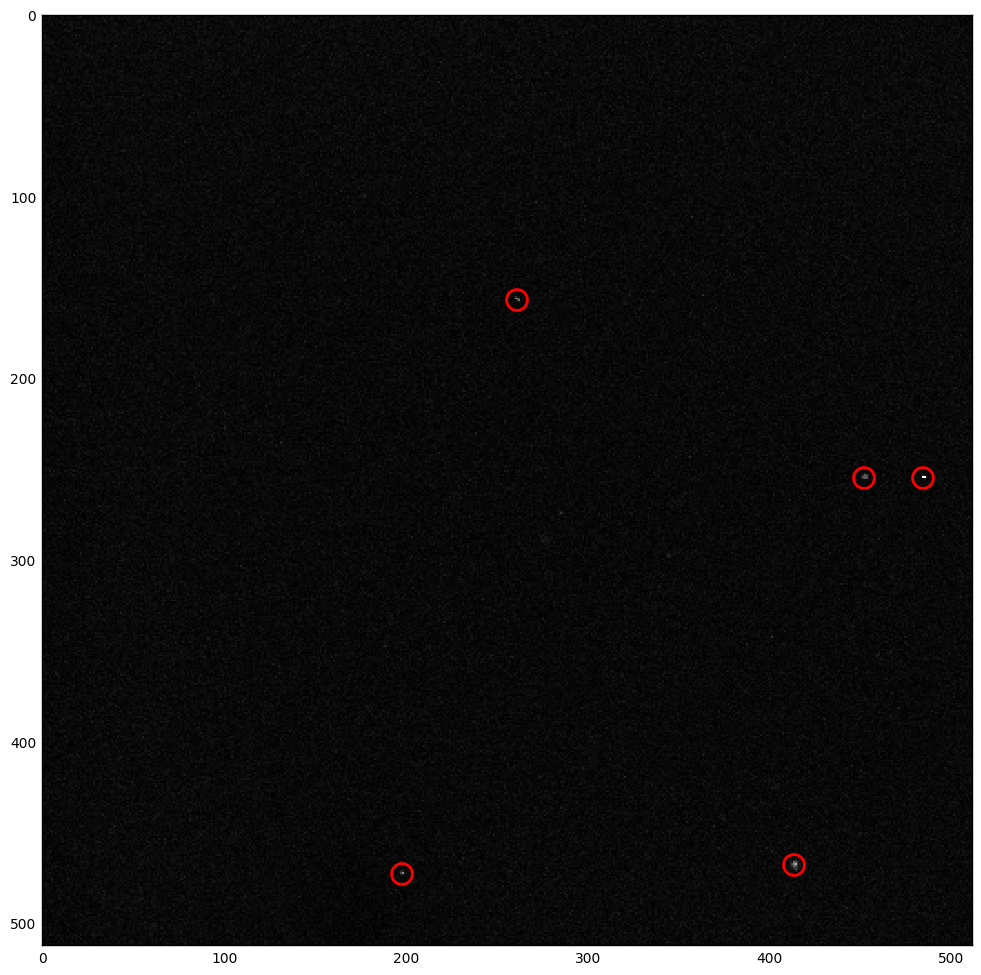

frame 216 of 218, channel 0


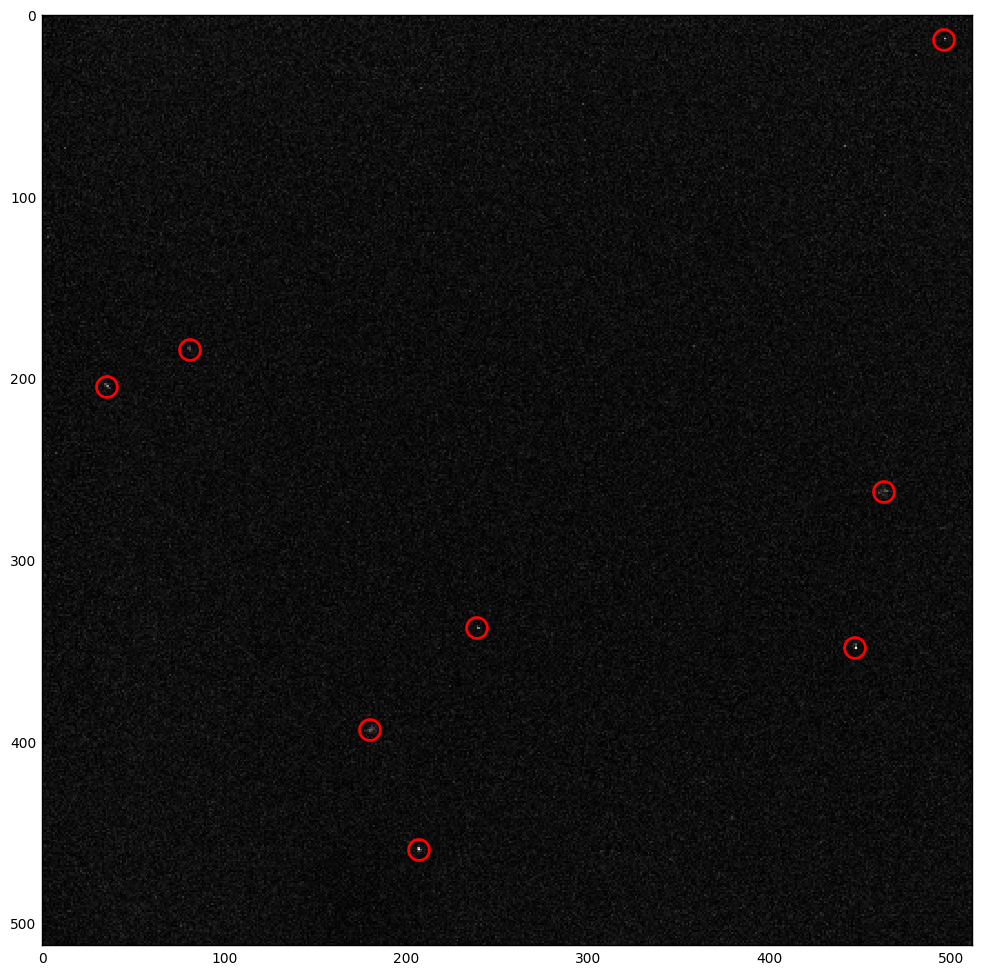

frame 0 of 218, channel 1


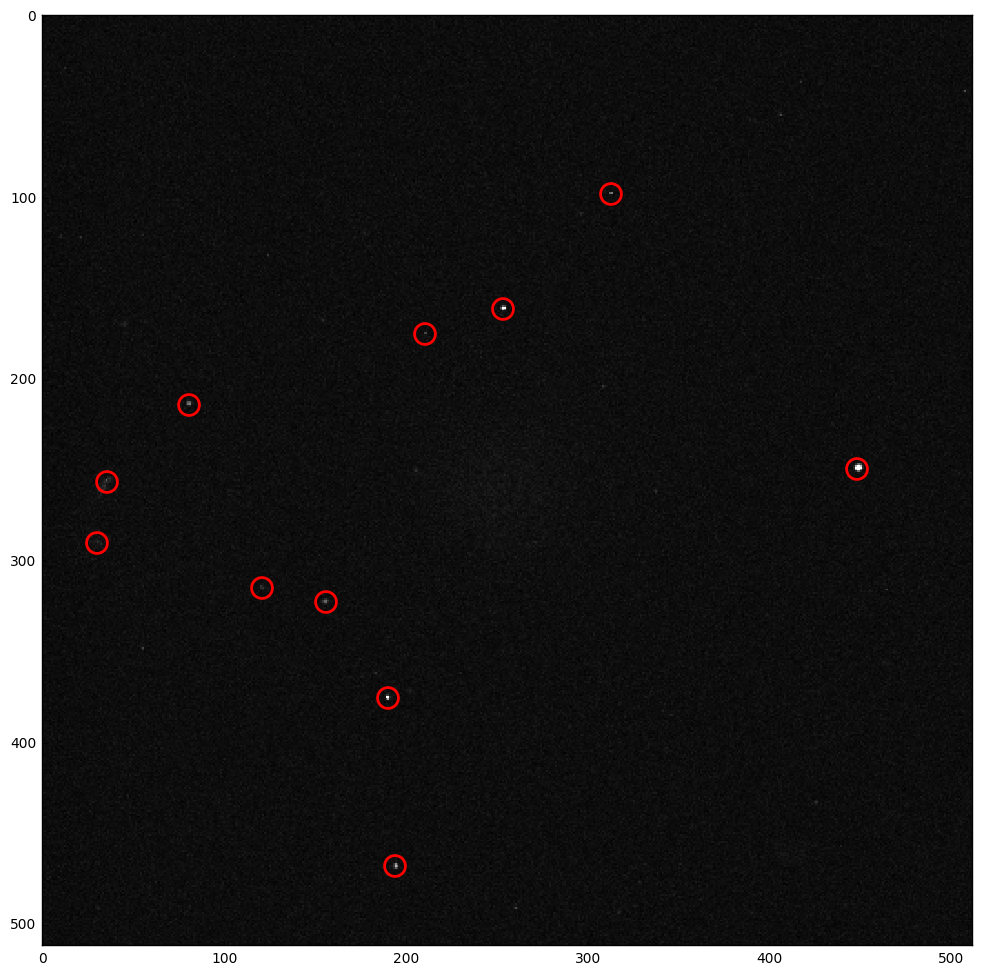

frame 109 of 218, channel 1


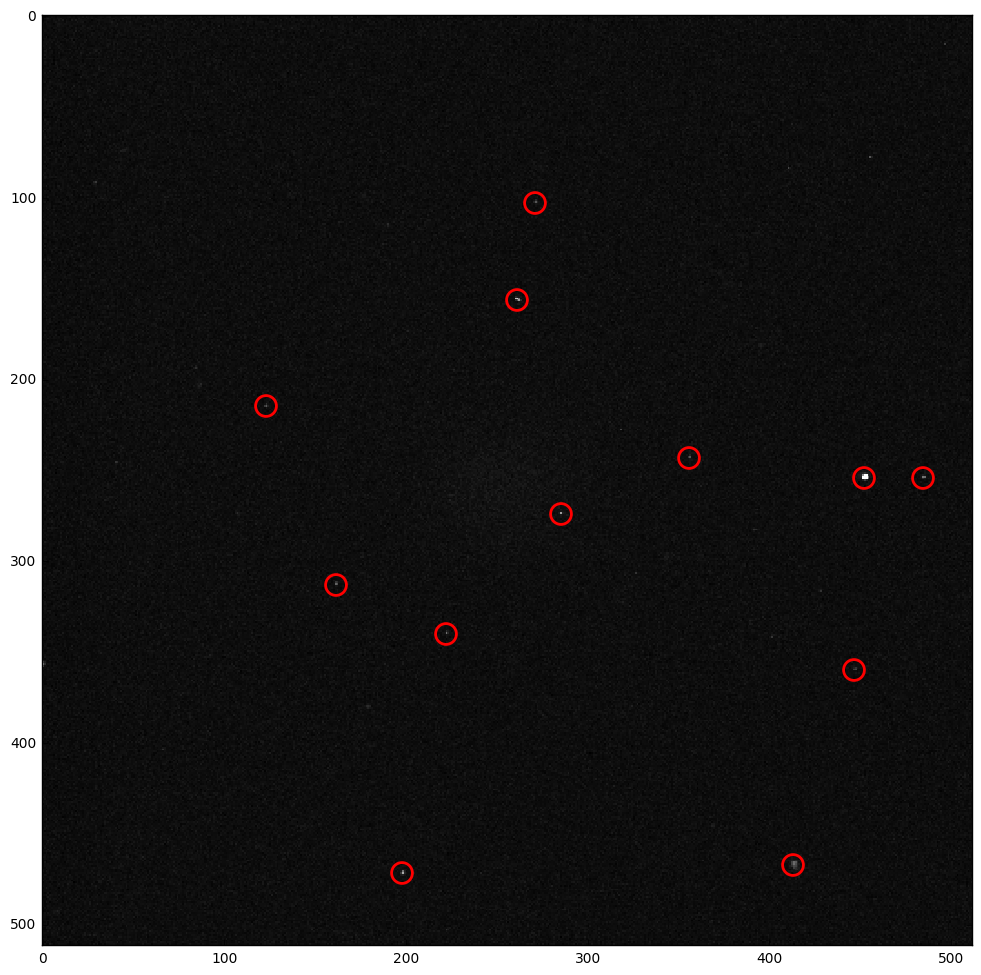

frame 216 of 218, channel 1


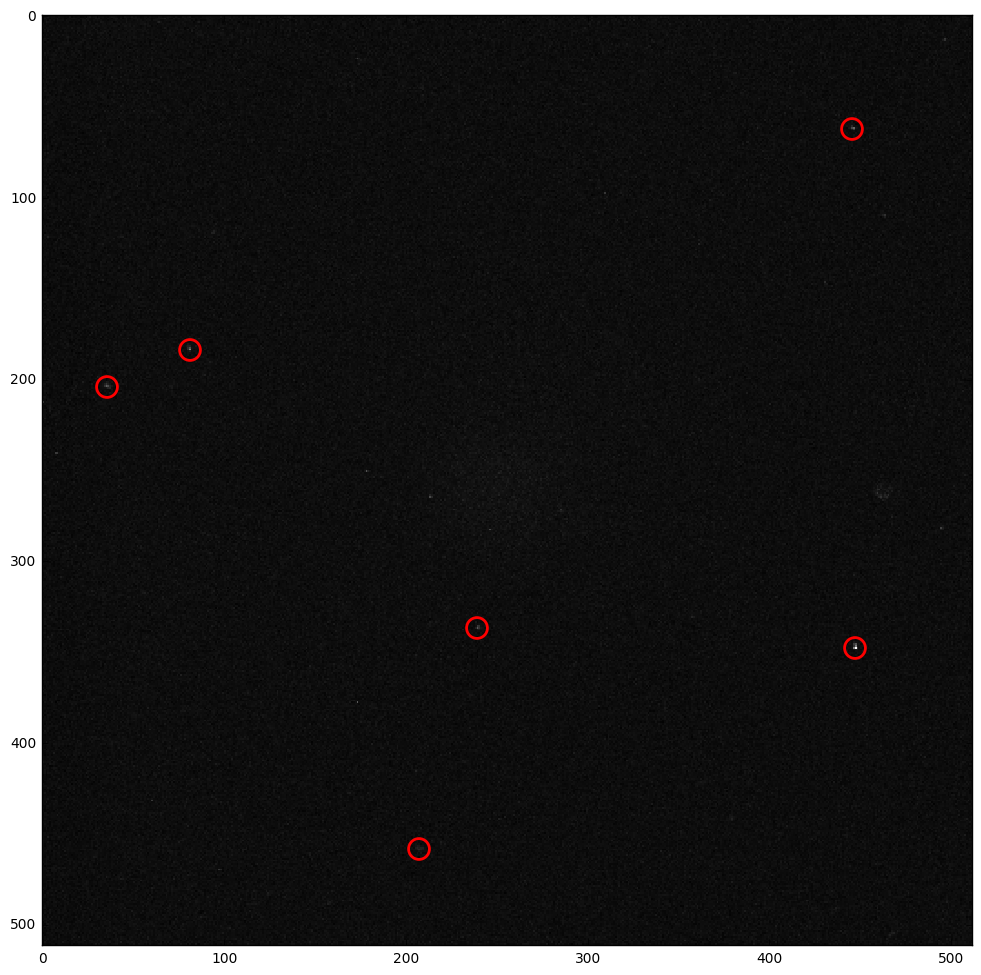

processing experiment: BATCH3_XP_R2
frame 0 of 179, channel 0


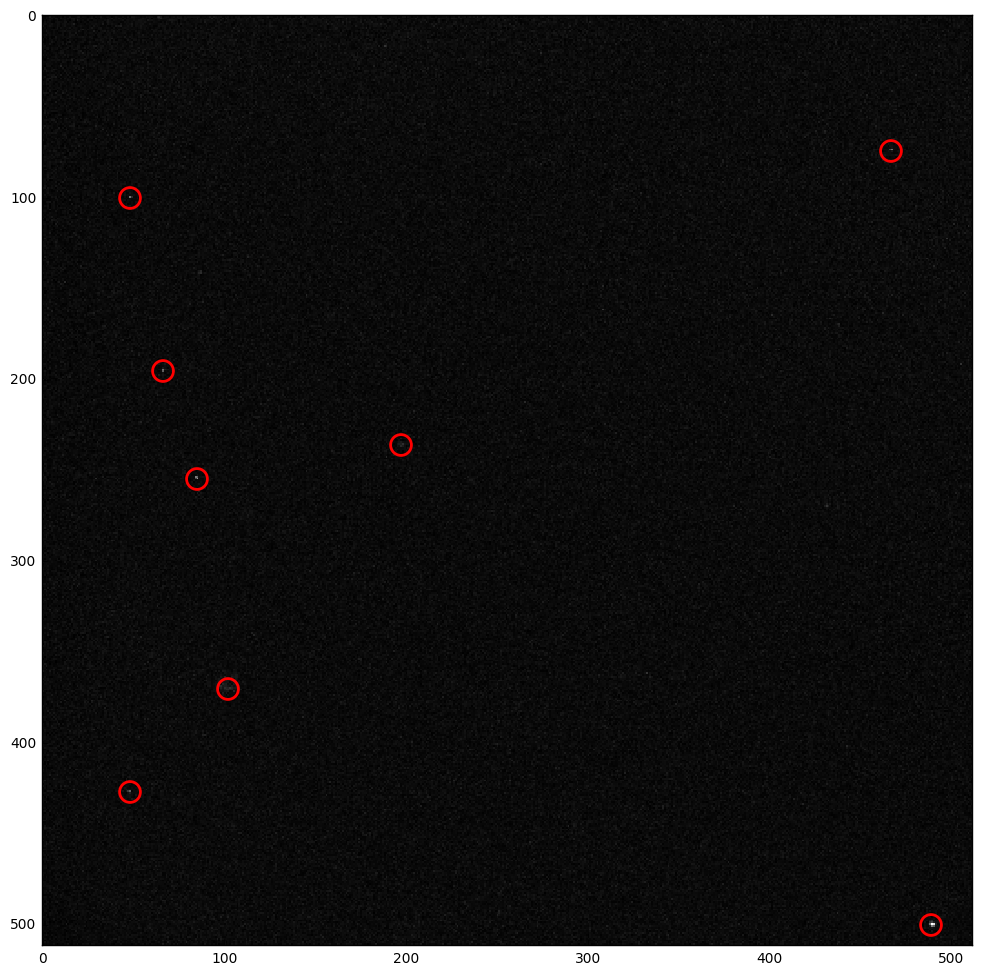

frame 89 of 179, channel 0


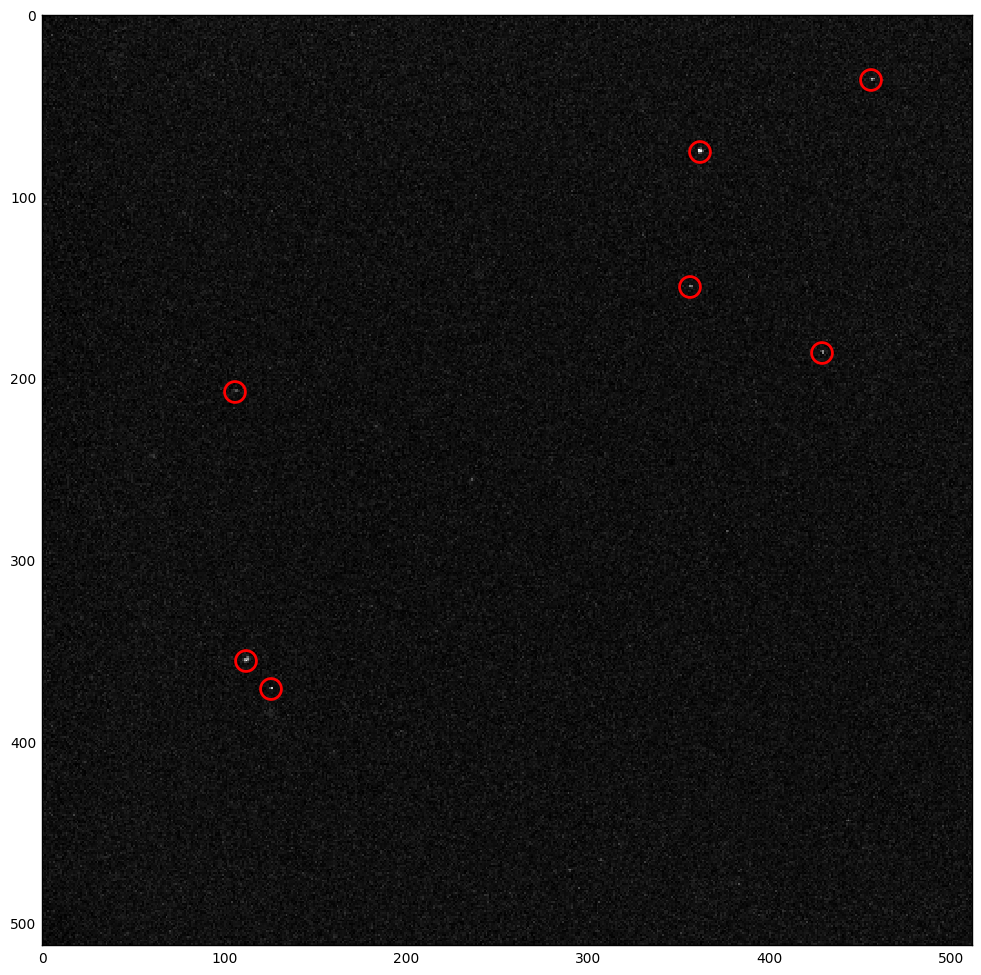

frame 177 of 179, channel 0


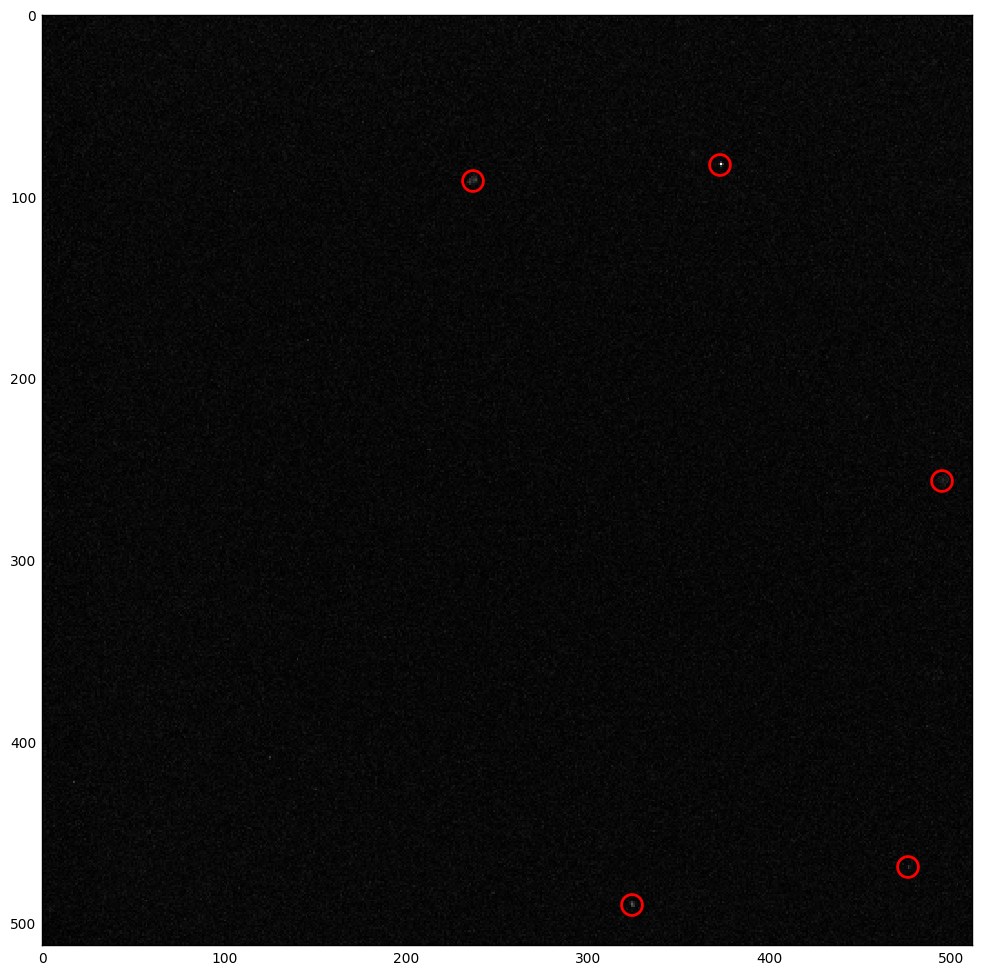

frame 0 of 179, channel 1


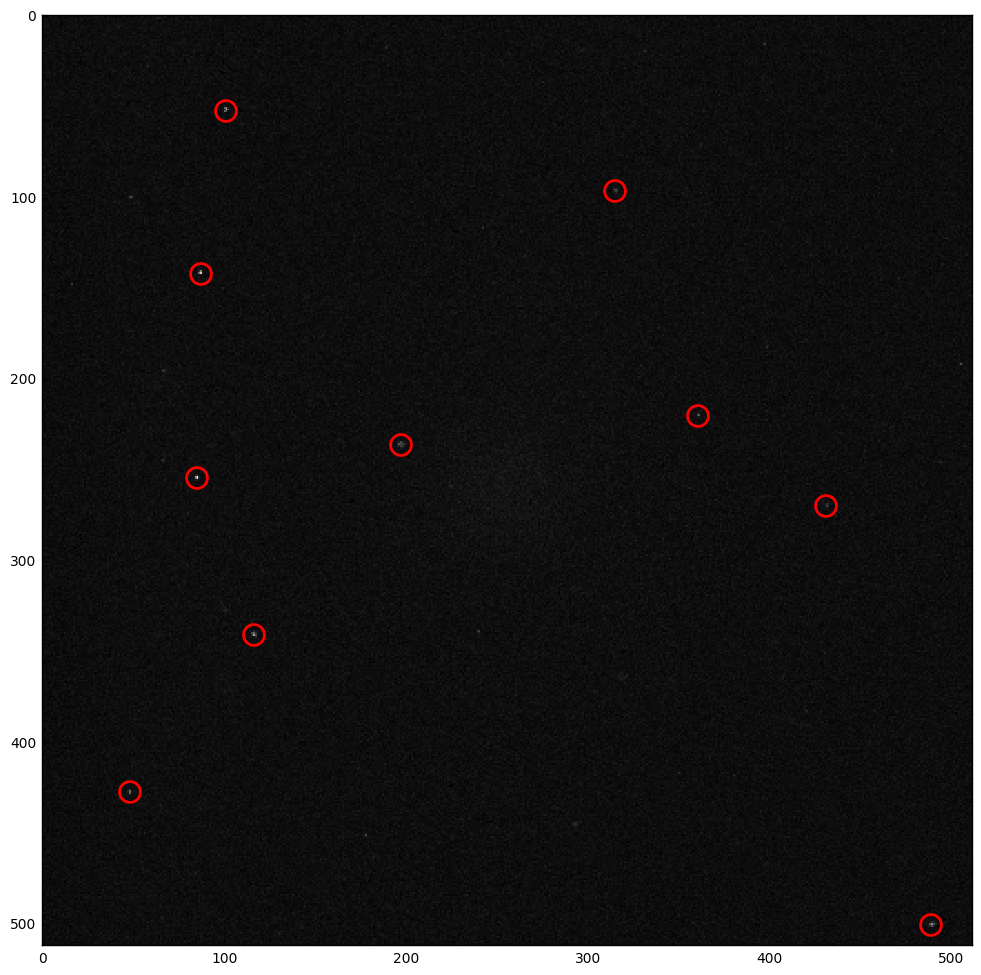

frame 89 of 179, channel 1


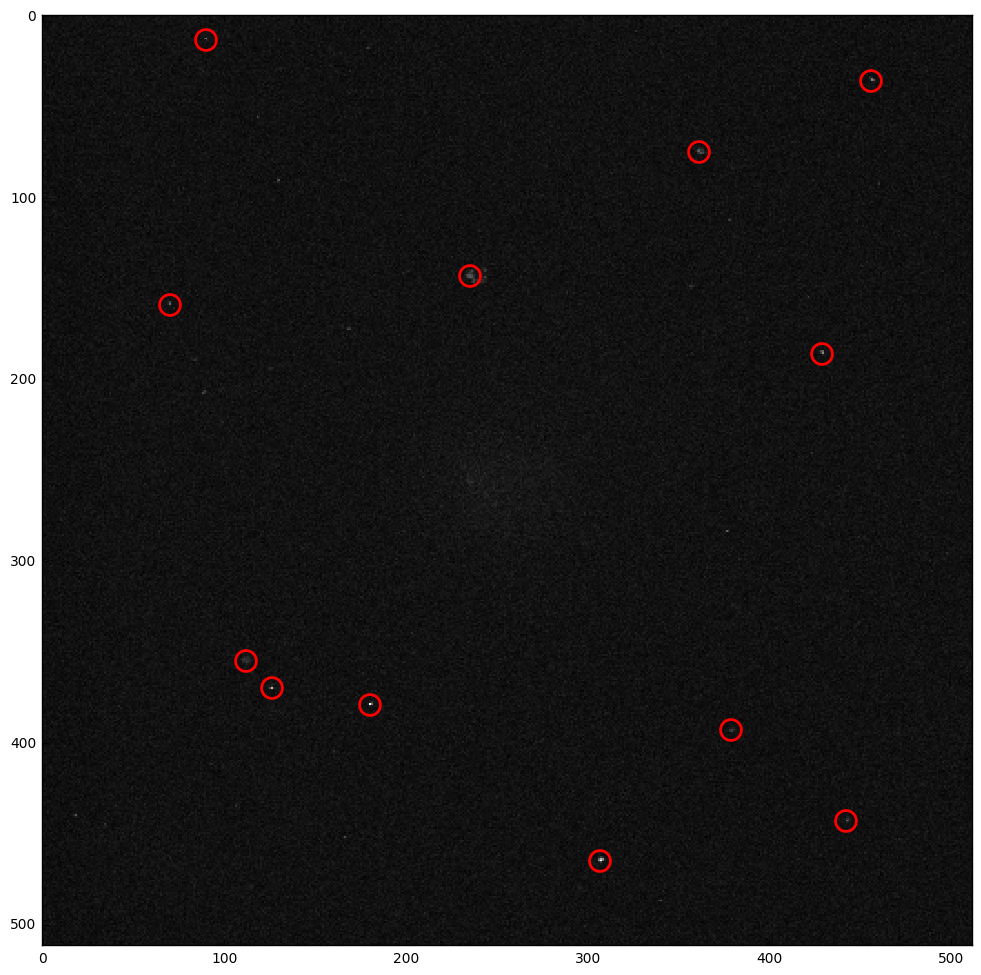

frame 177 of 179, channel 1


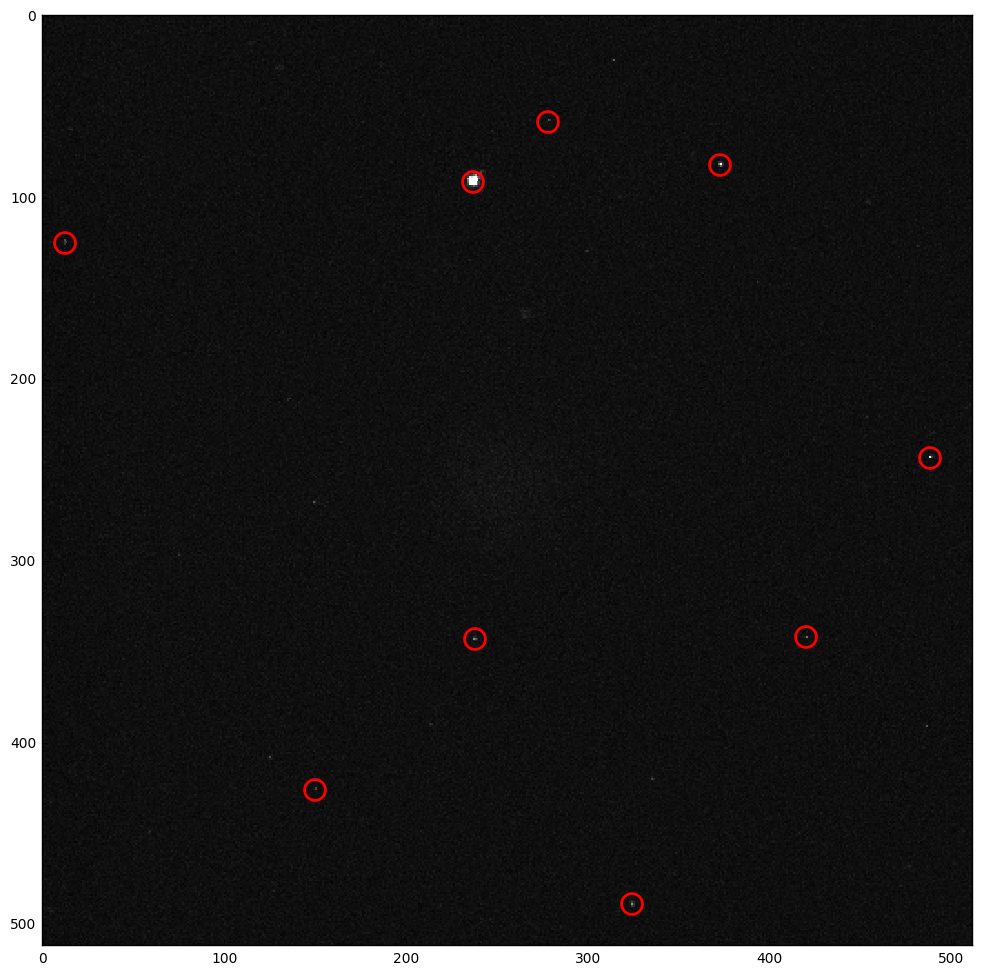

processing experiment: BATCH3_XP_R1
frame 0 of 210, channel 0


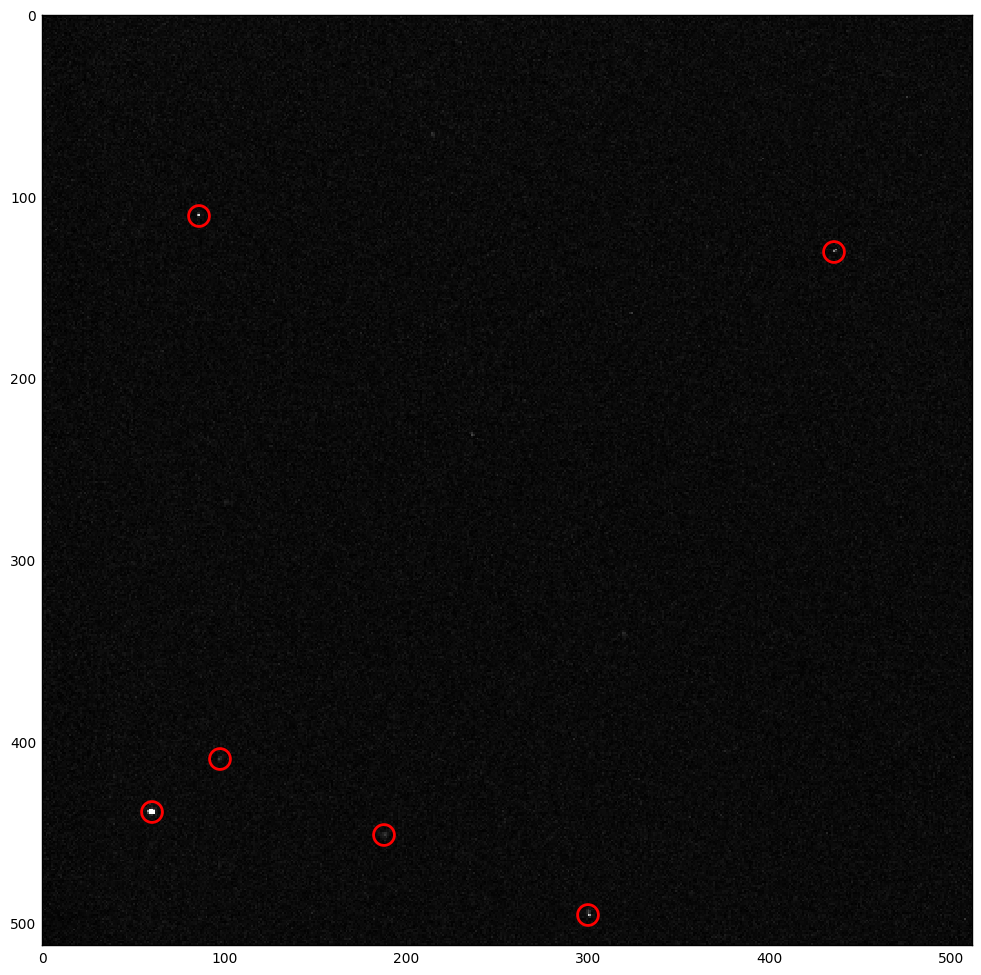

frame 105 of 210, channel 0


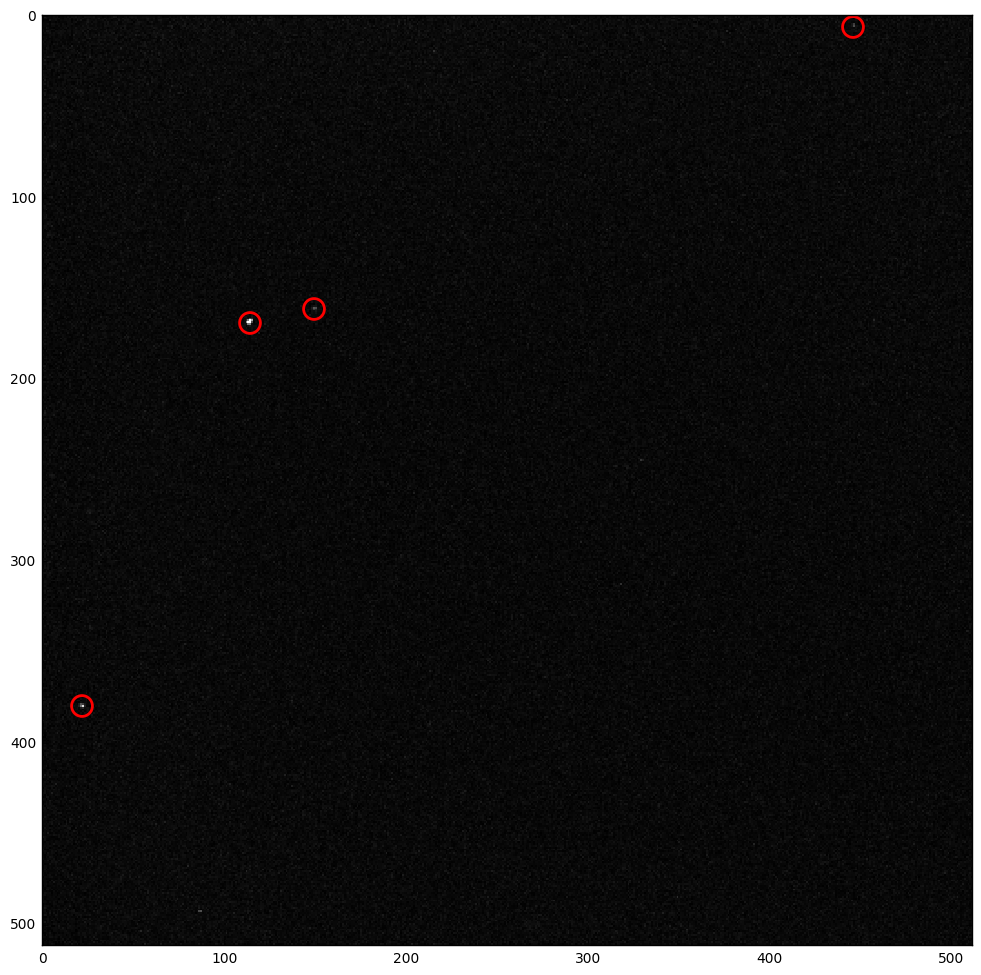

frame 208 of 210, channel 0


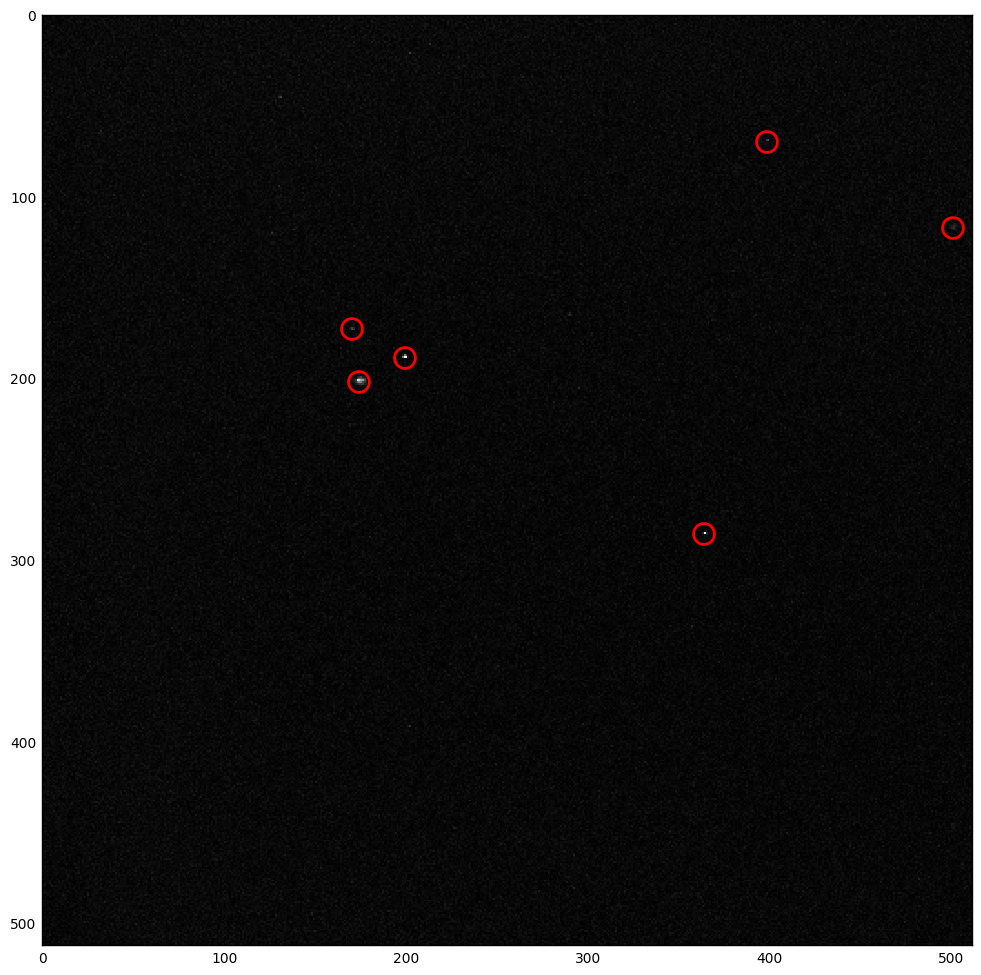

frame 0 of 210, channel 1


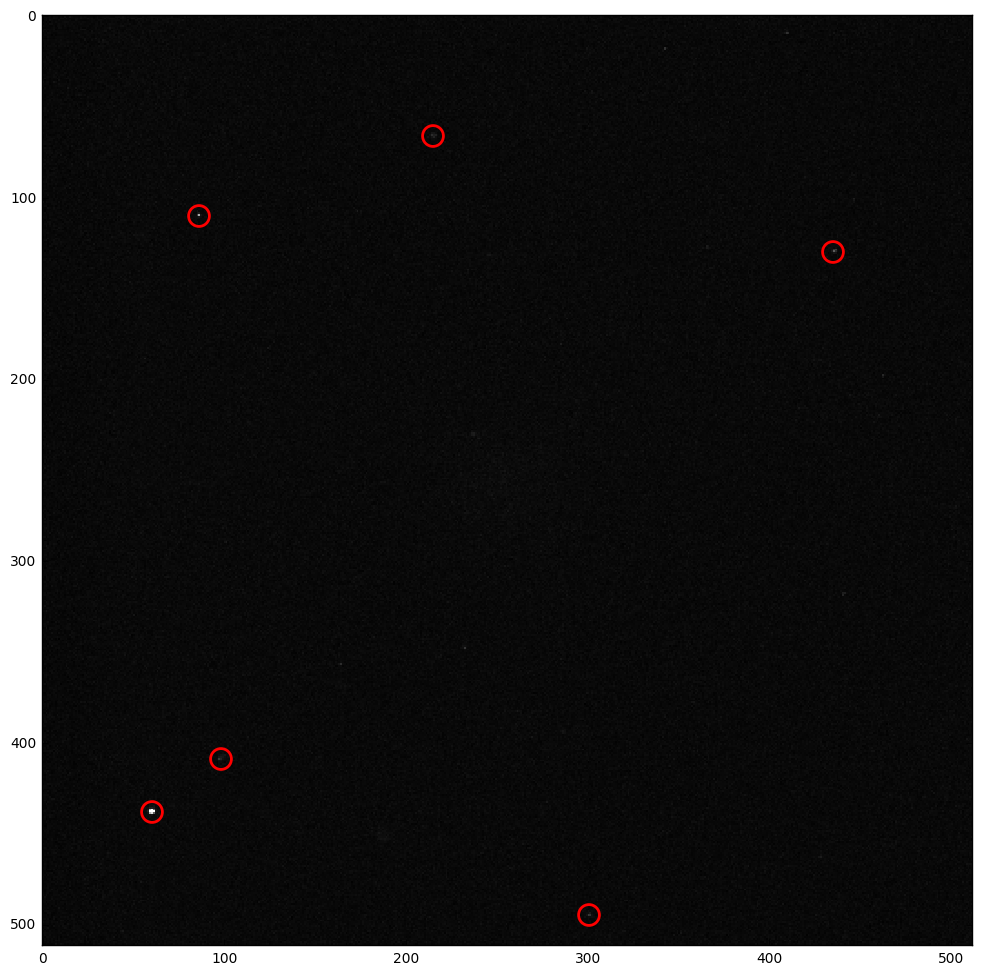

frame 105 of 210, channel 1


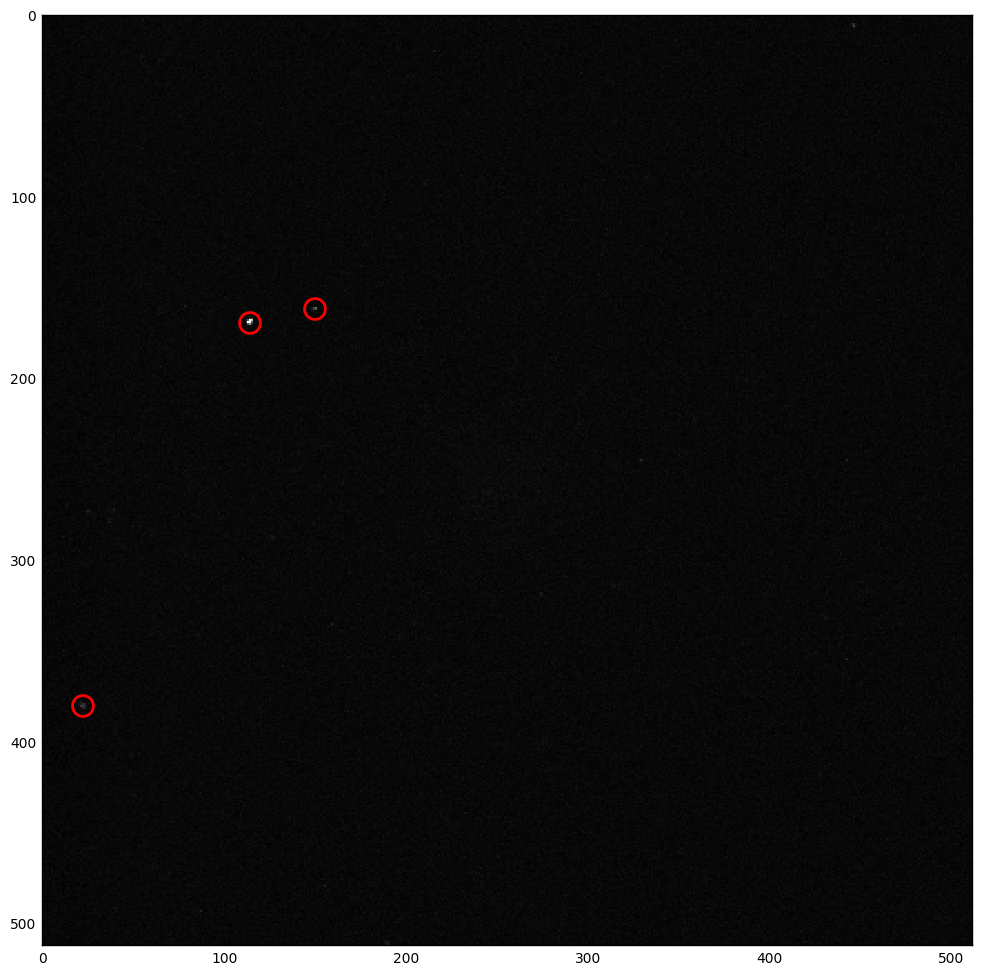

frame 208 of 210, channel 1


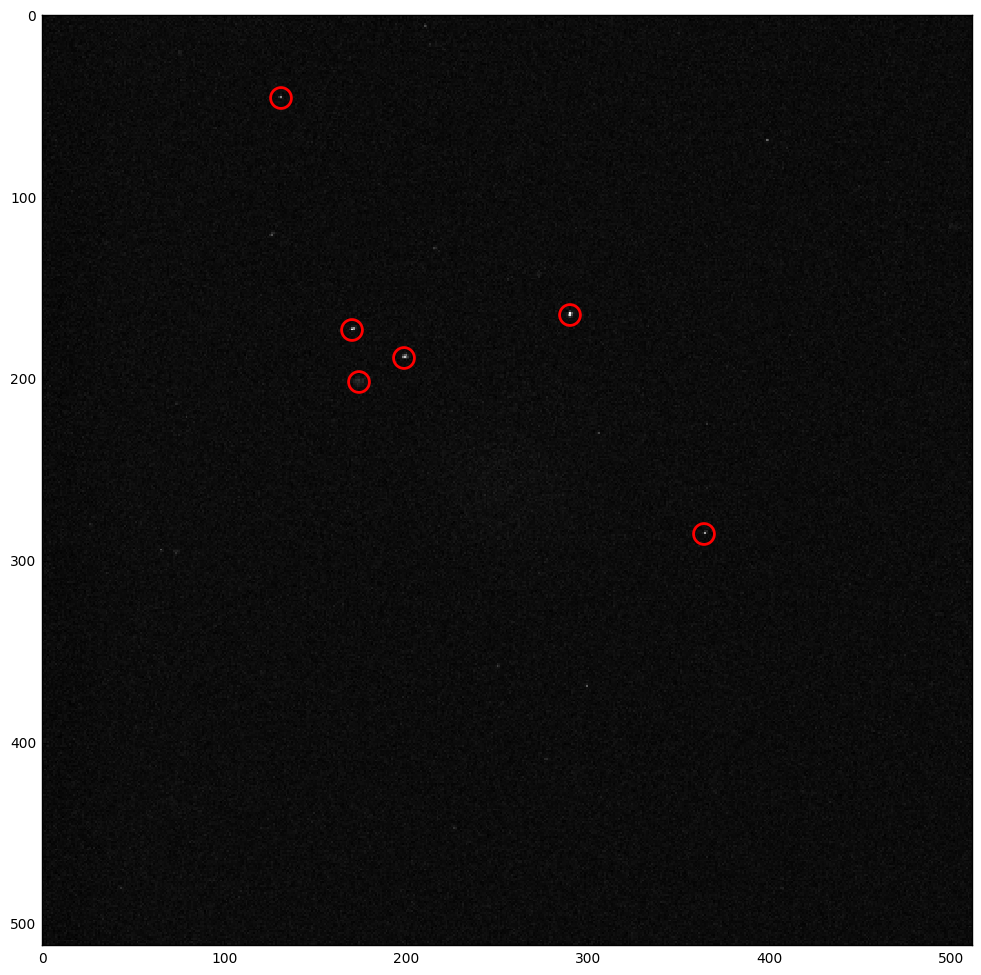

processing experiment: BATCH3_XPDGAtpMgcl2WithHkAld_R1
frame 0 of 132, channel 0


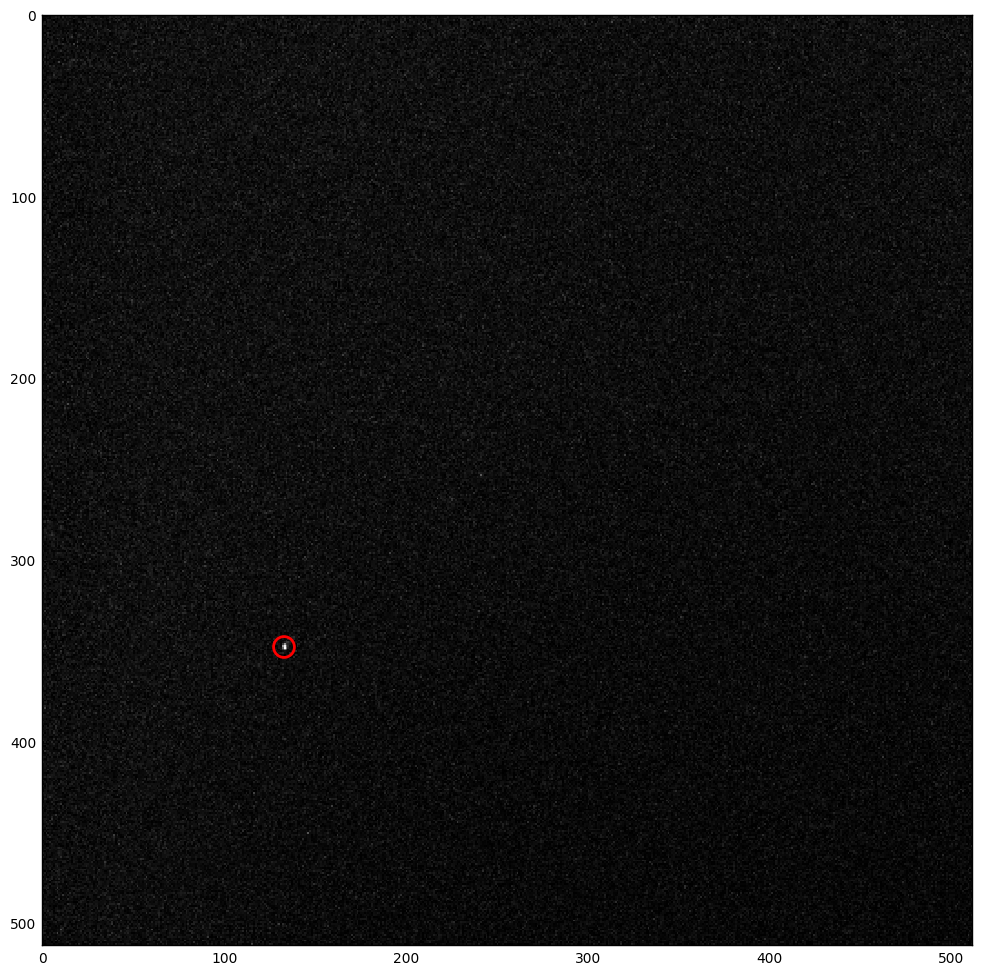

frame 66 of 132, channel 0


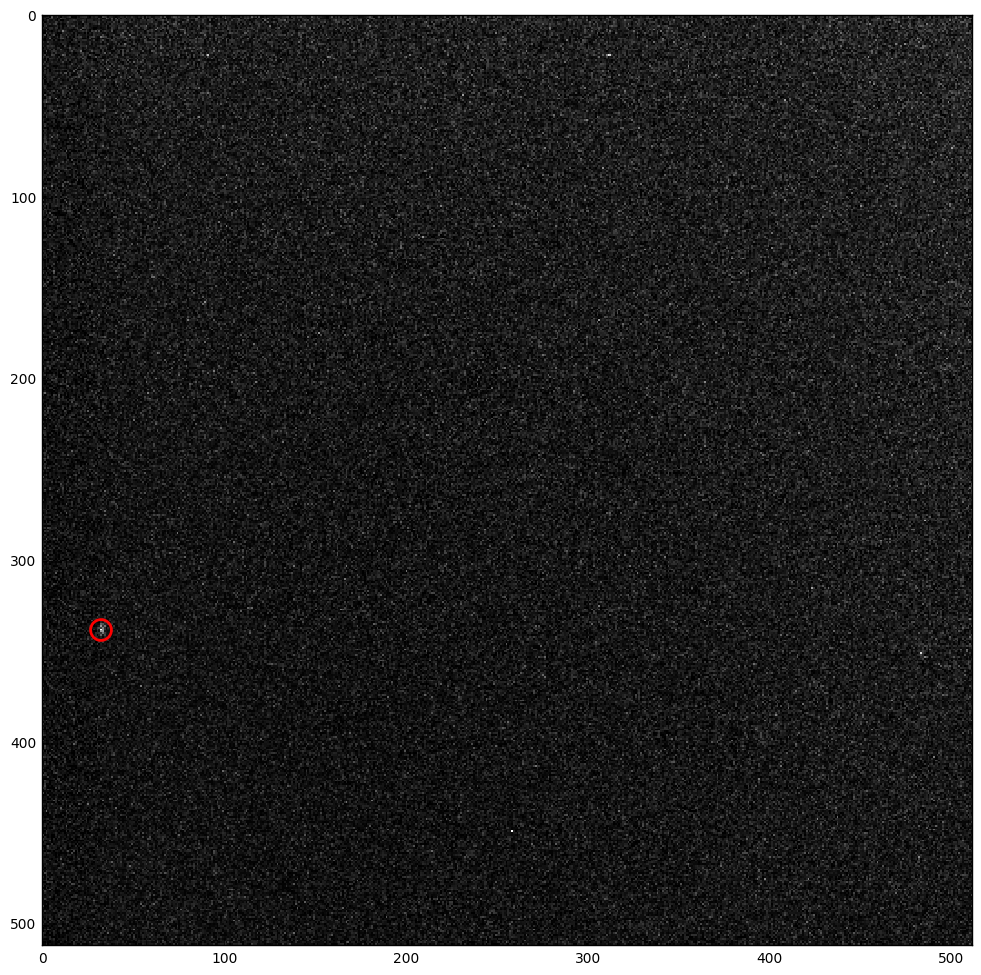

frame 130 of 132, channel 0


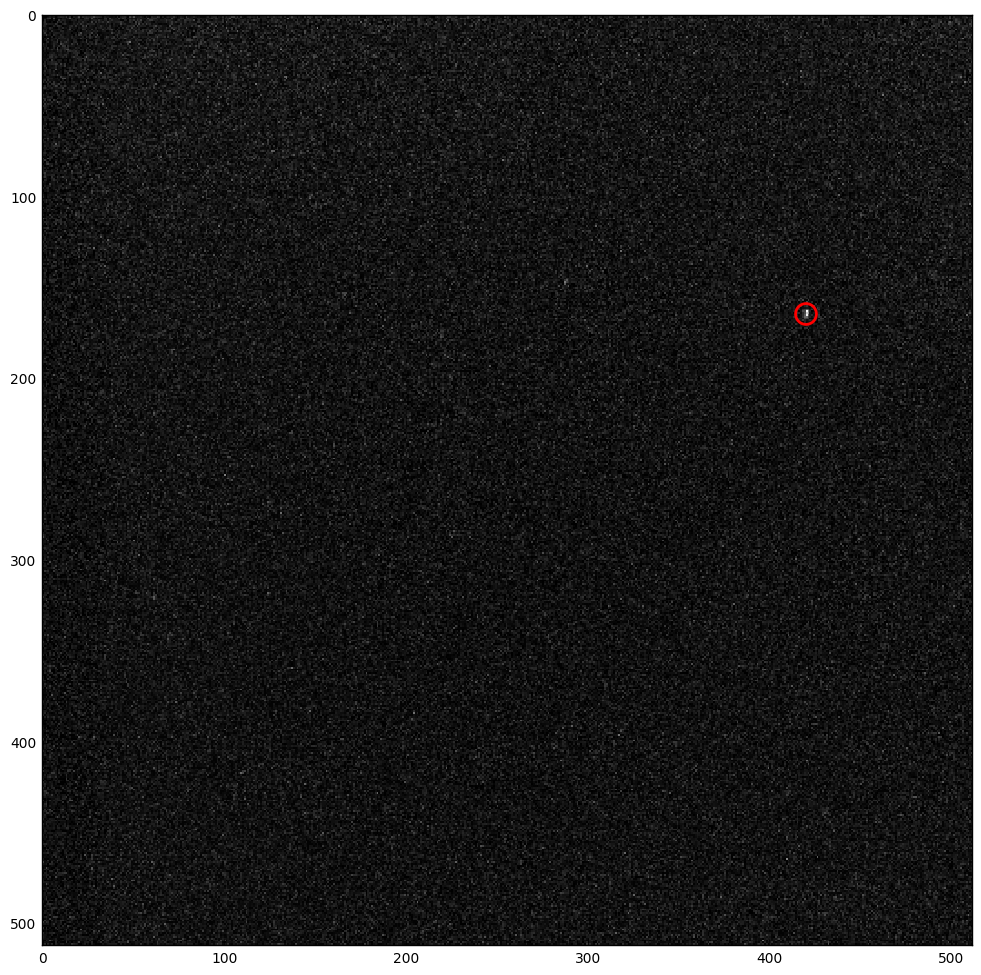

frame 0 of 132, channel 1


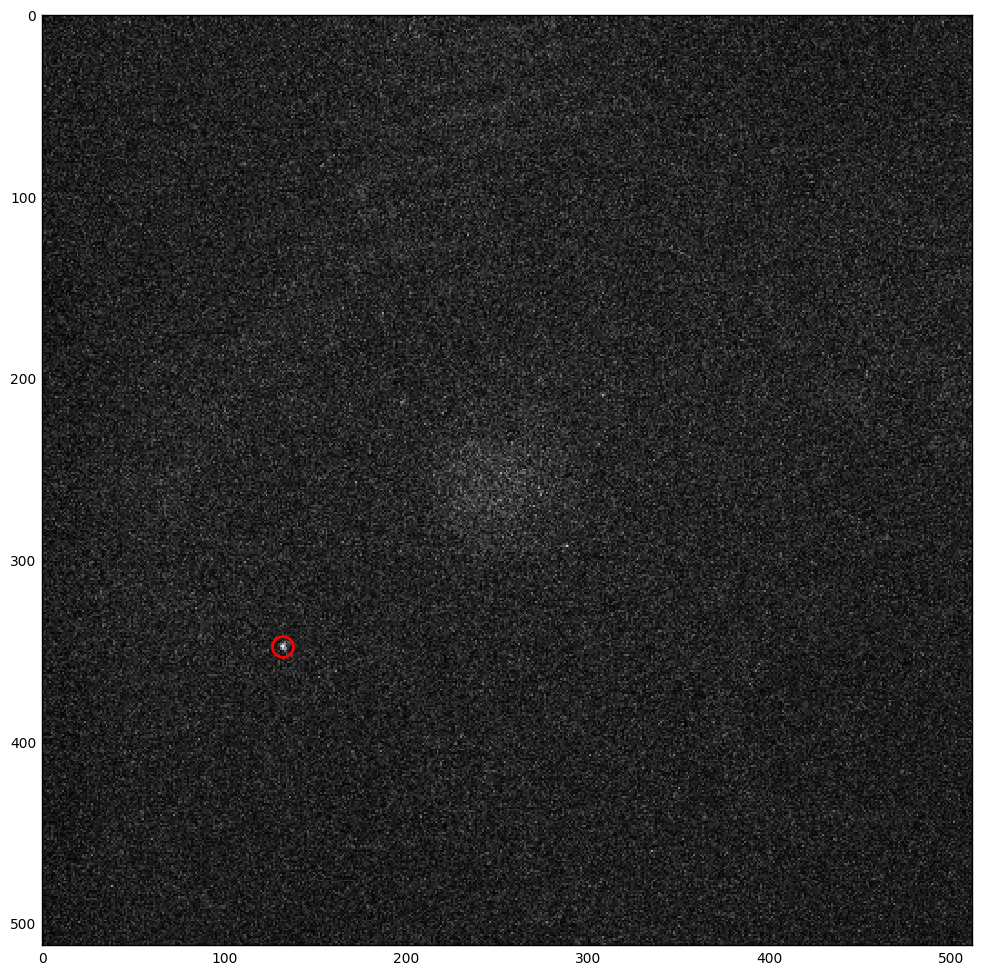

frame 66 of 132, channel 1


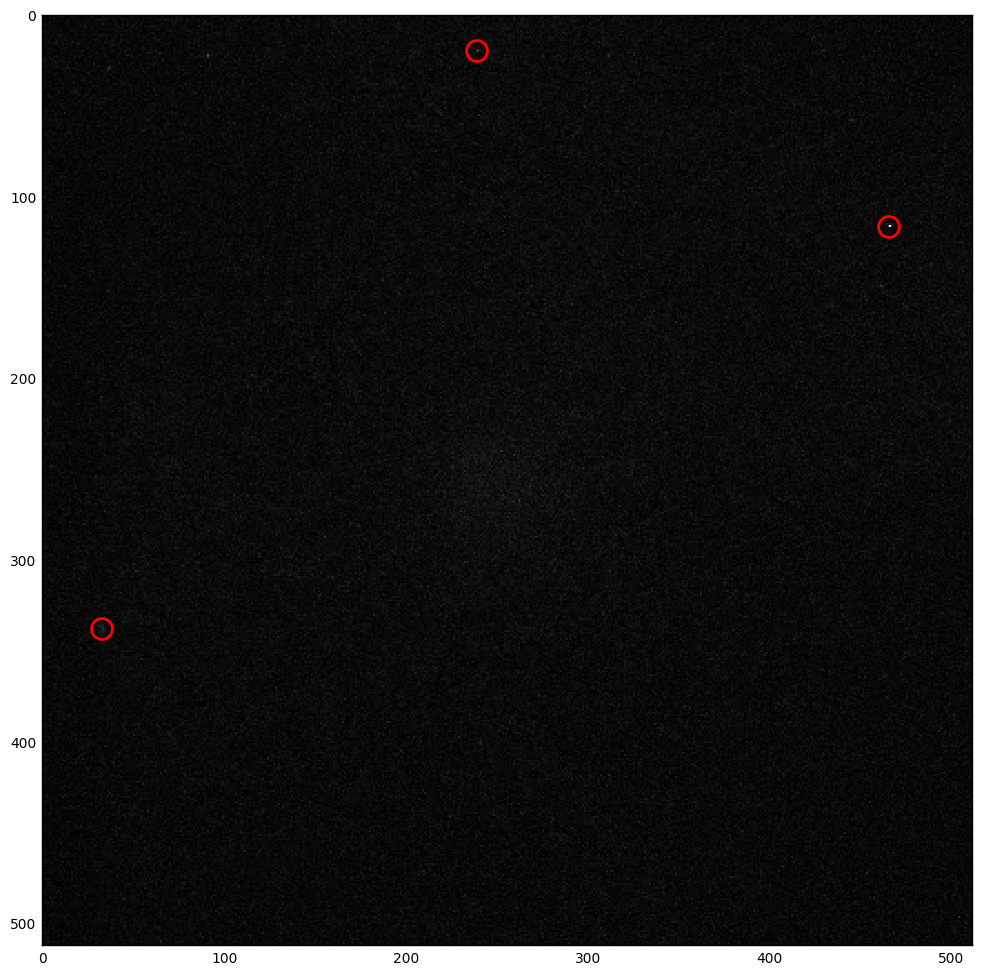

frame 130 of 132, channel 1


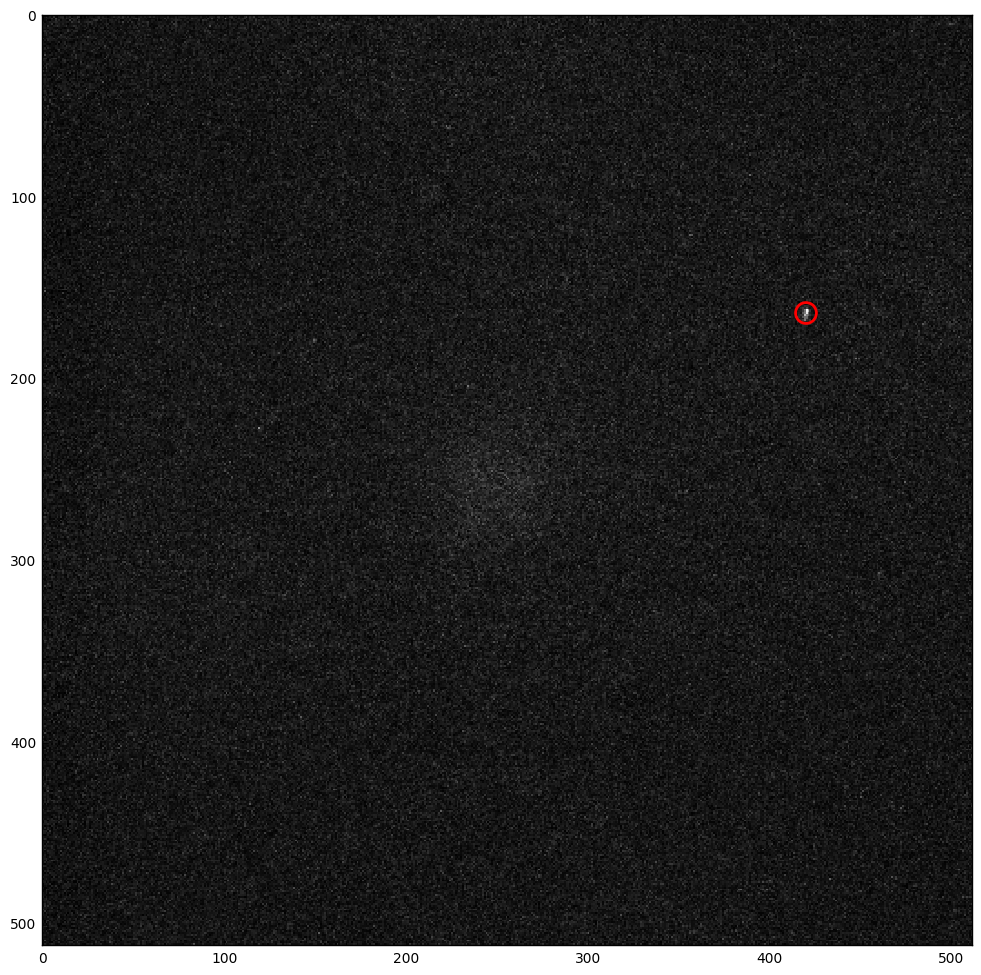

processing experiment: BATCH3_XPDGAtpMgcl2WithHkAld_R3
frame 0 of 49, channel 0


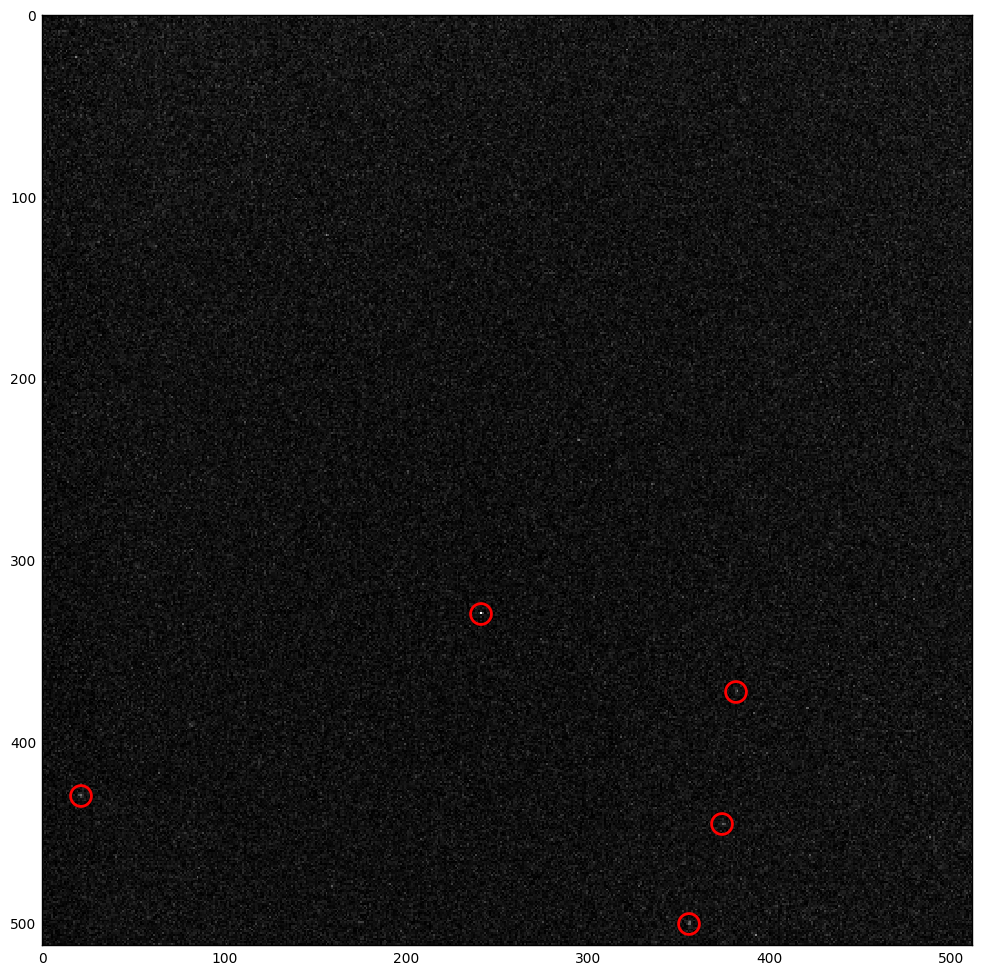

frame 24 of 49, channel 0


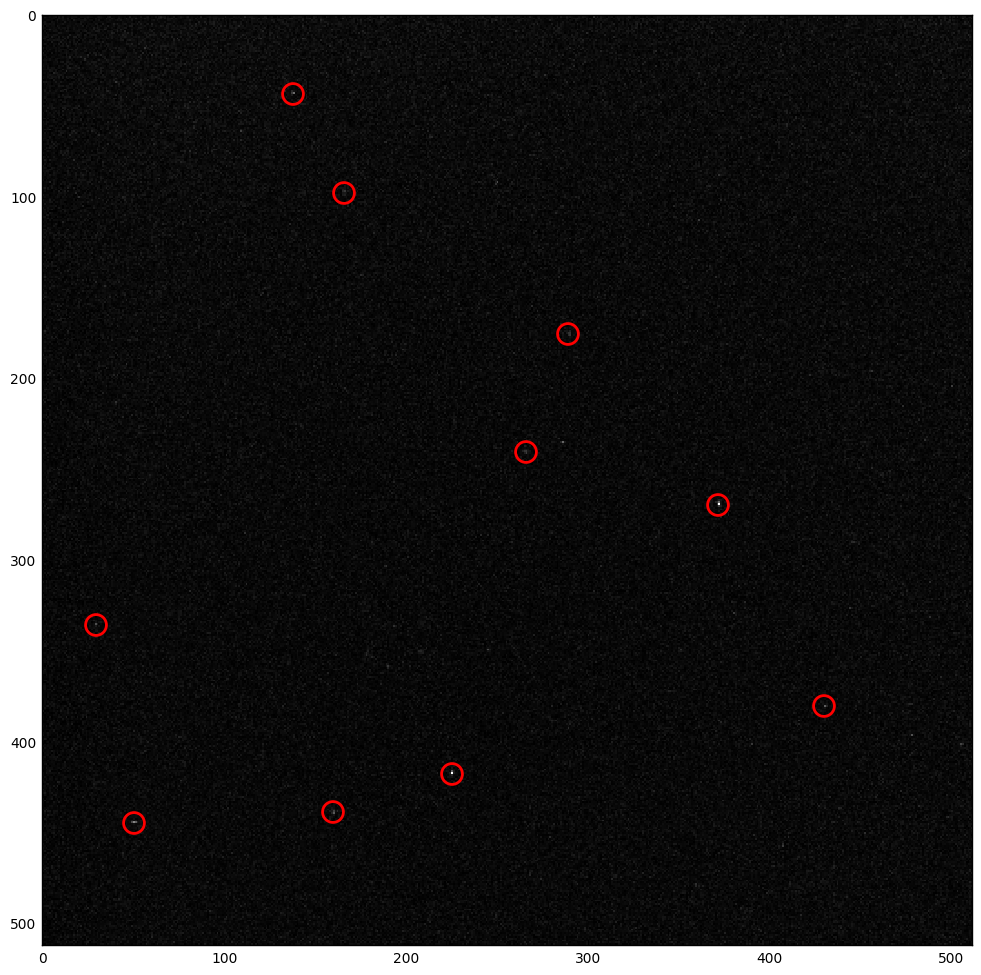

frame 47 of 49, channel 0


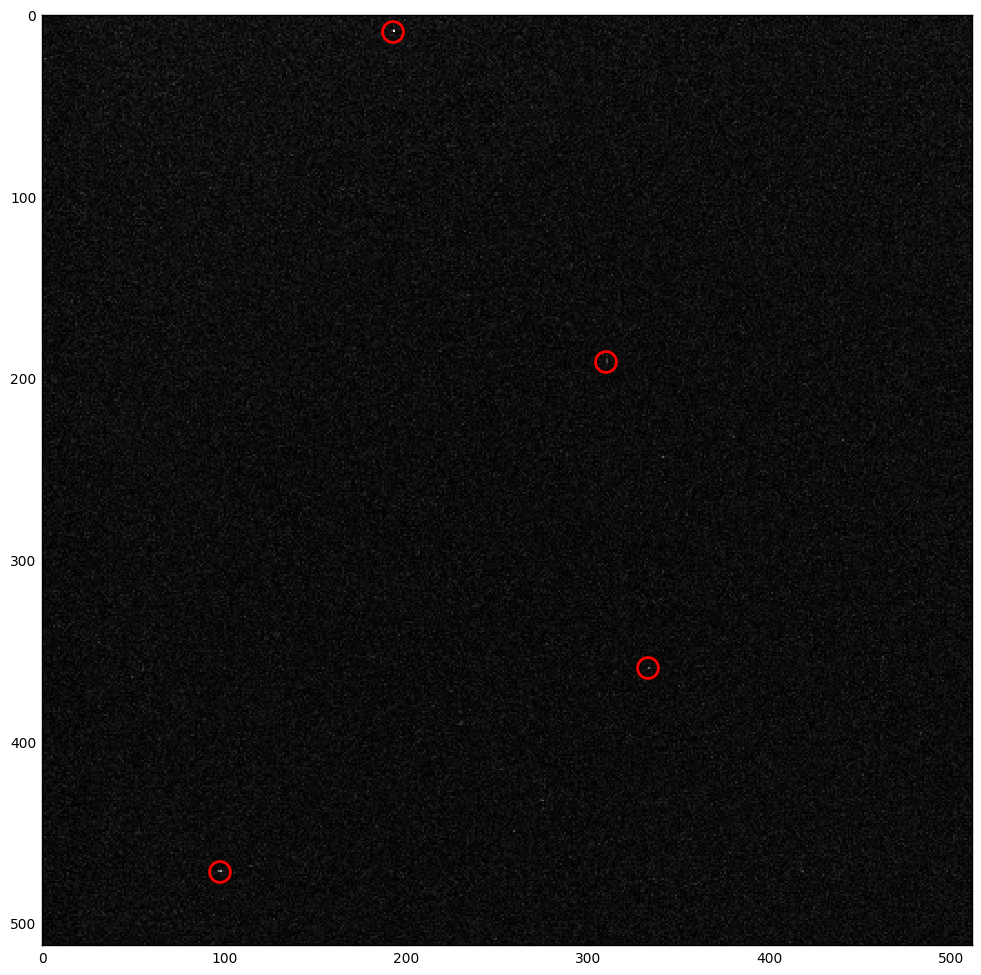

frame 0 of 49, channel 1


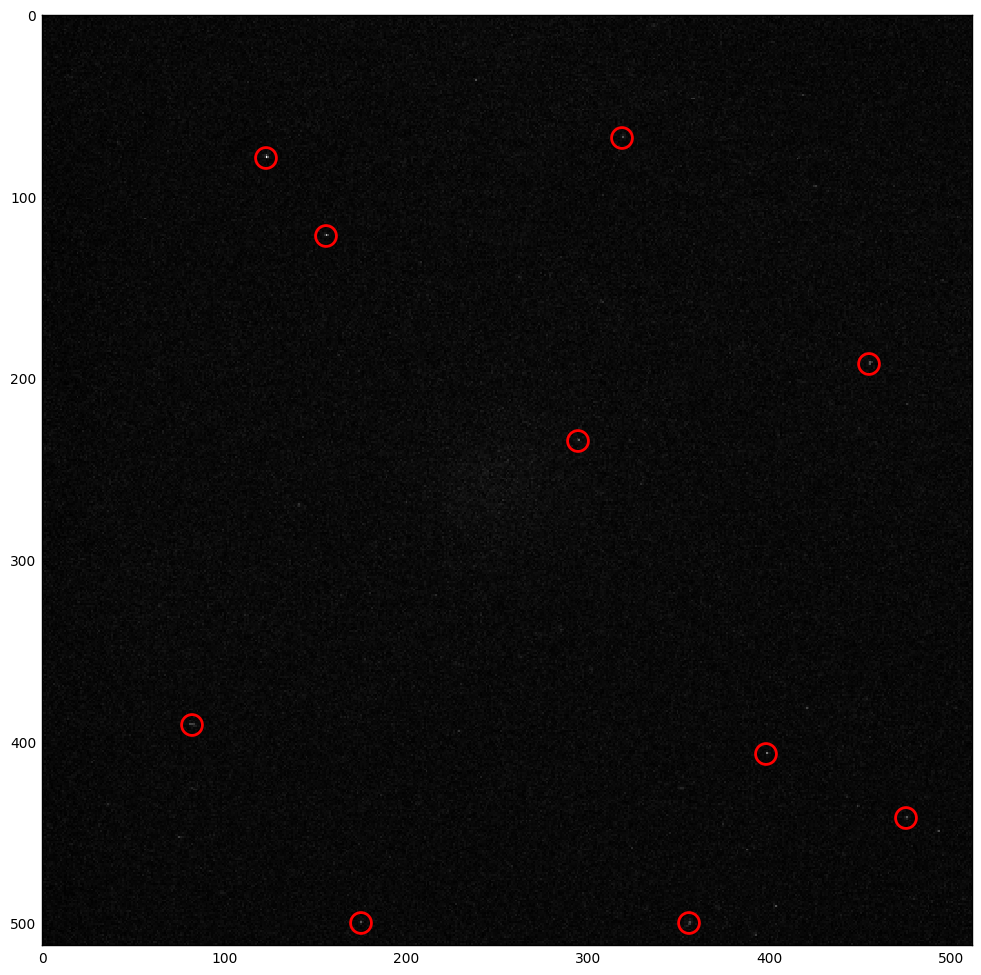

frame 24 of 49, channel 1


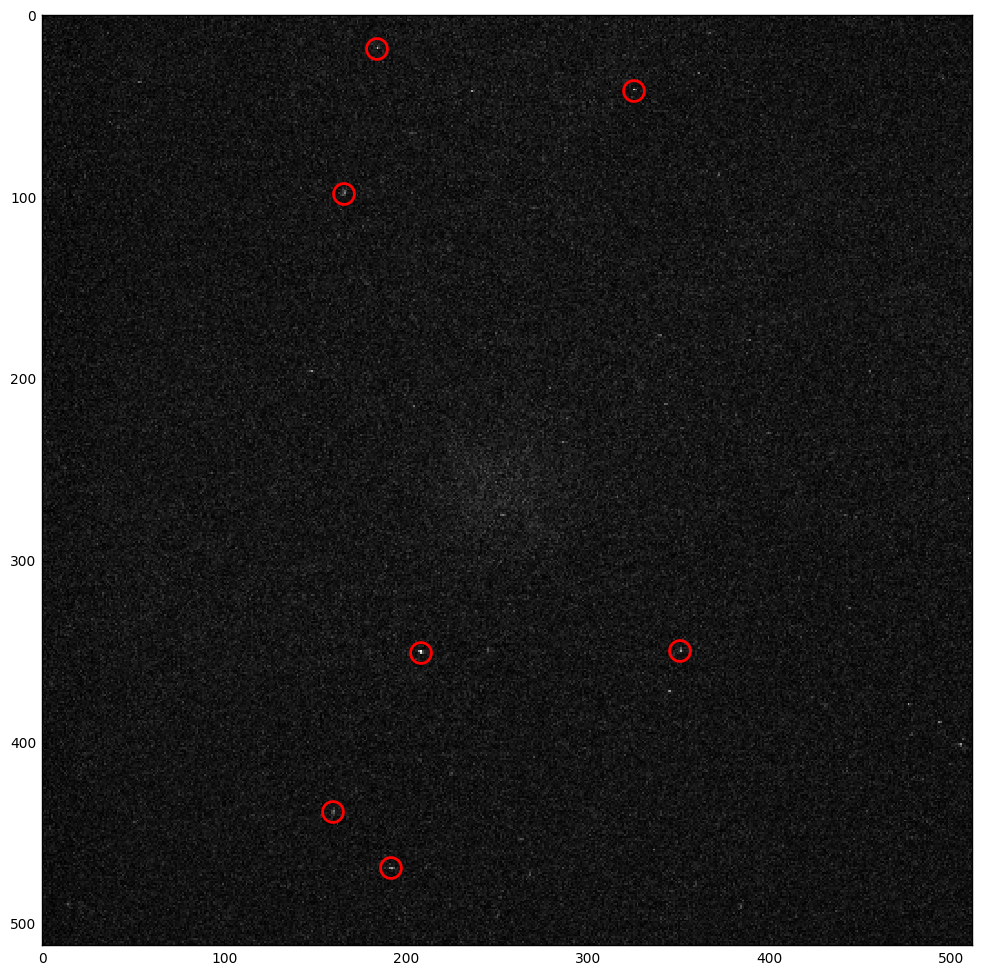

frame 47 of 49, channel 1


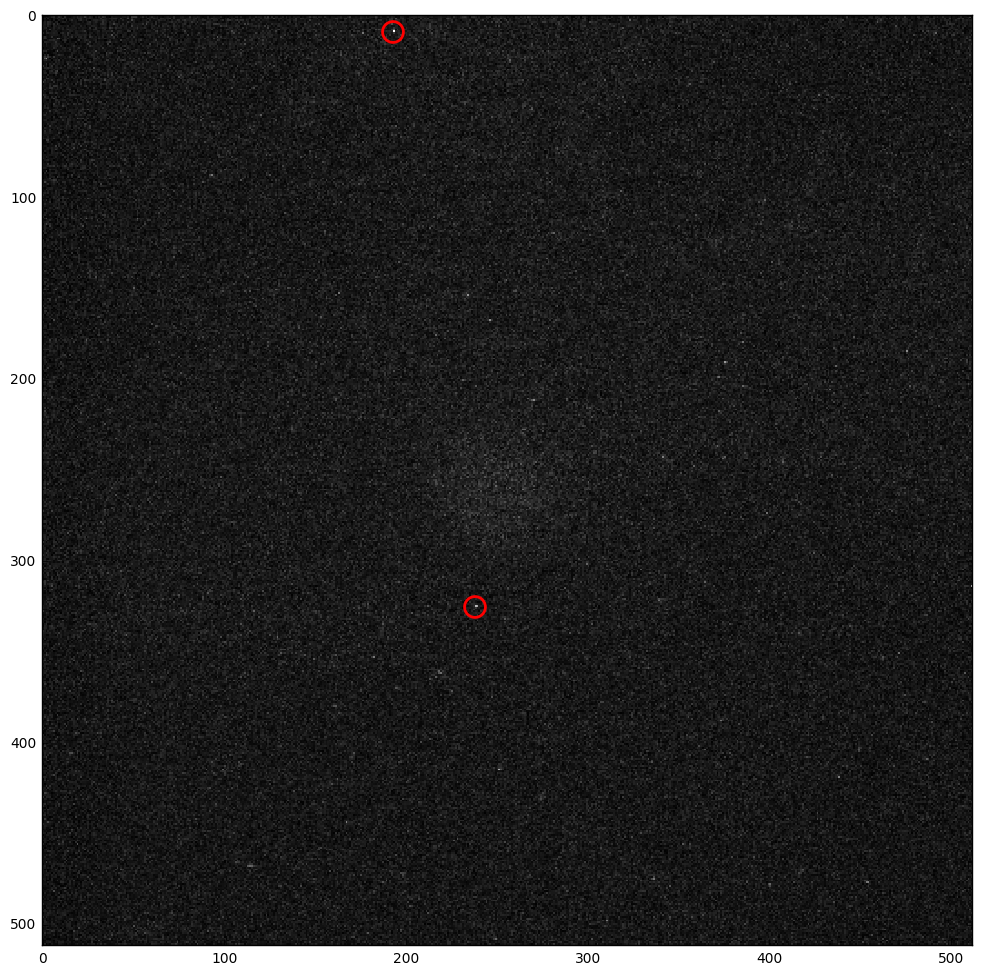

processing experiment: BATCH3_XPDGAtpMgcl2WithHkAld_R2
frame 0 of 88, channel 0


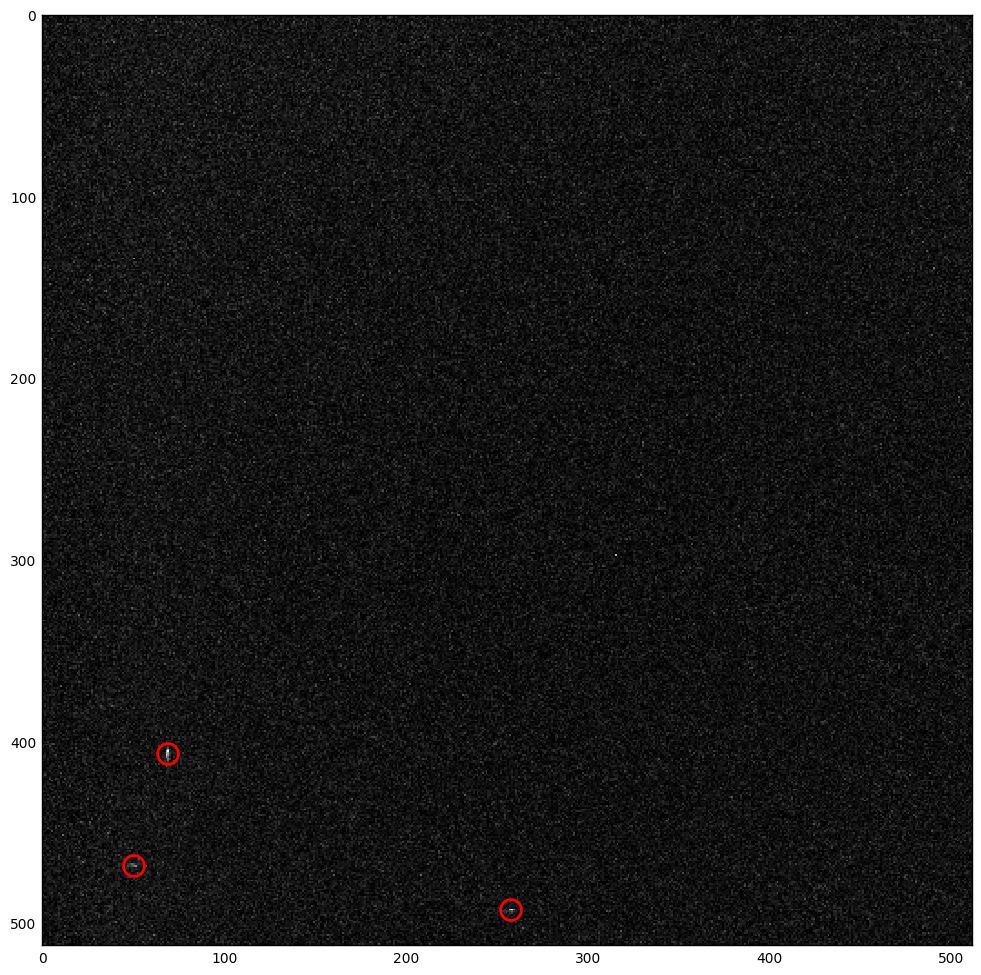

frame 44 of 88, channel 0


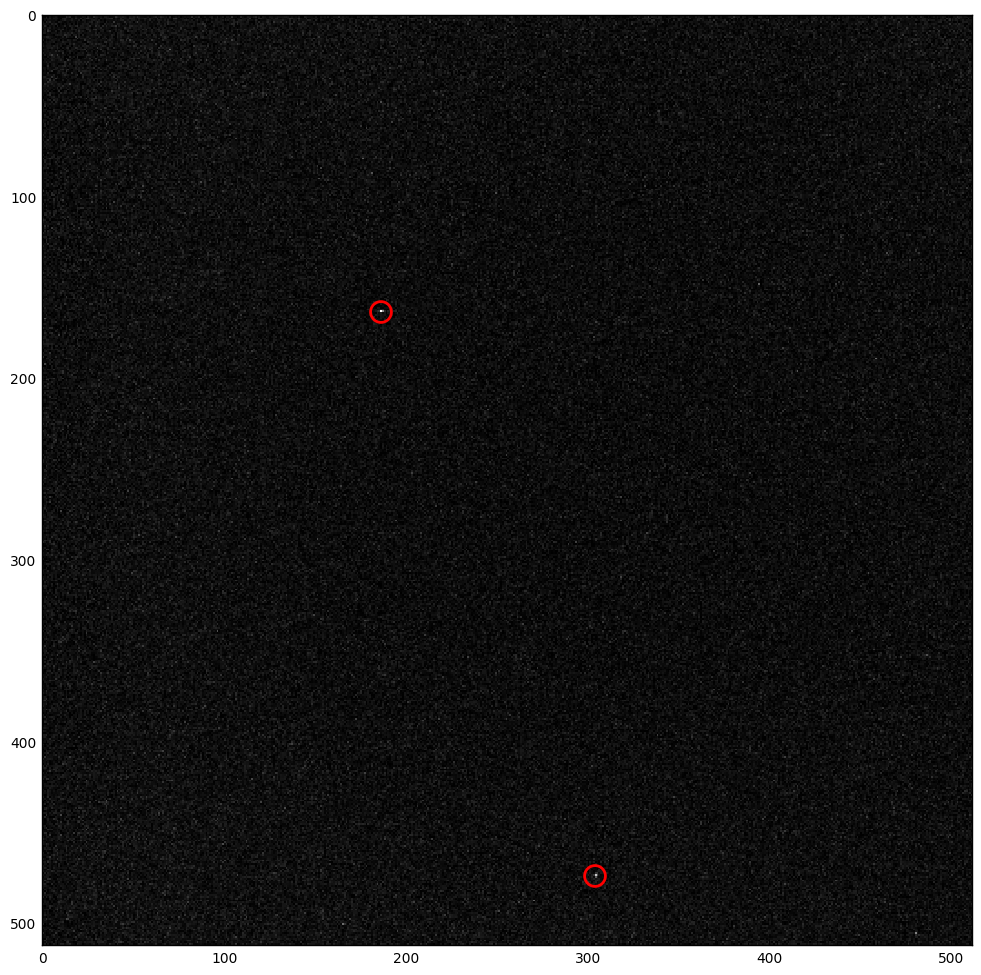

frame 86 of 88, channel 0


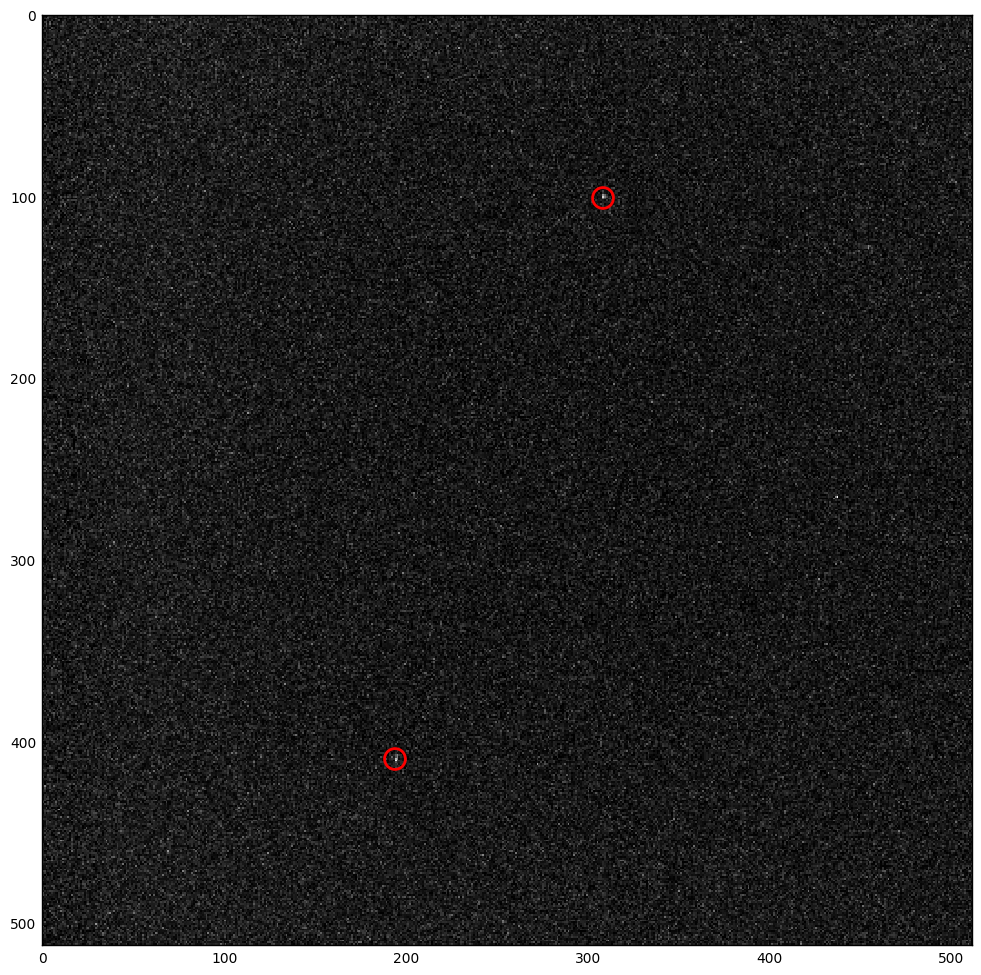

frame 0 of 88, channel 1


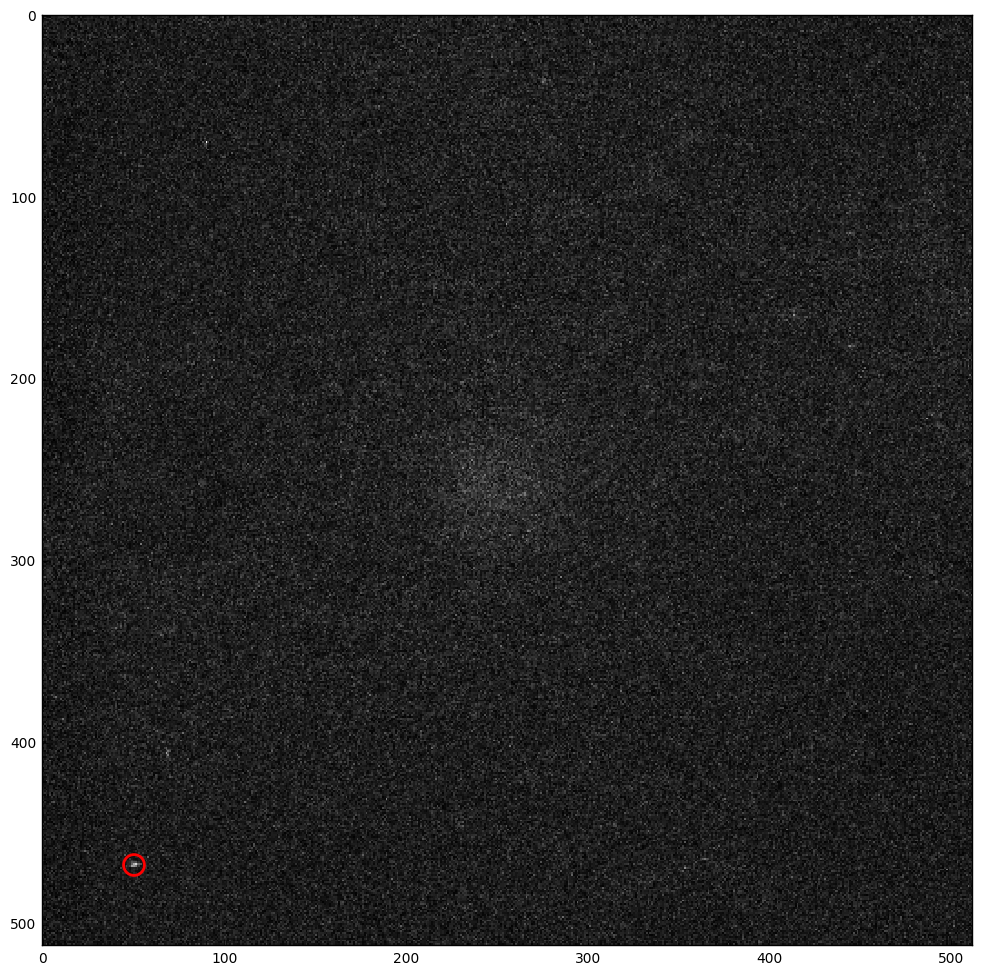

frame 44 of 88, channel 1


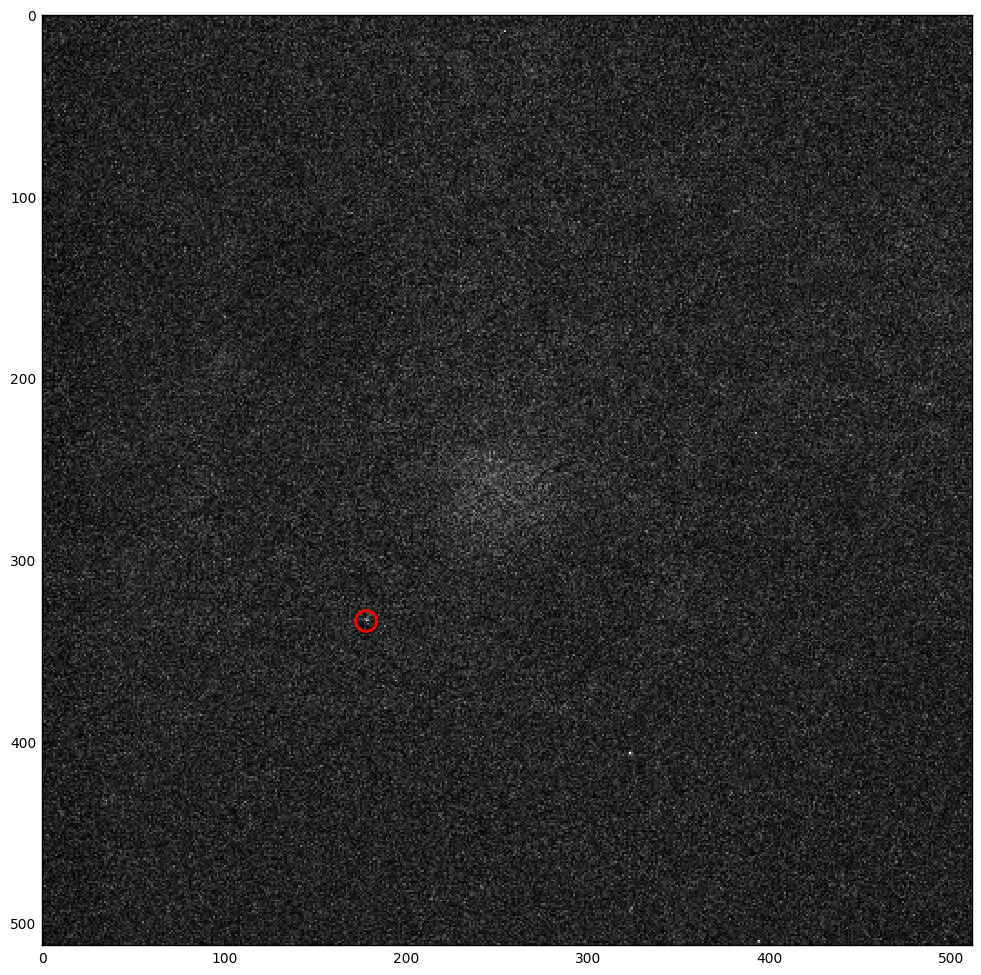

frame 86 of 88, channel 1


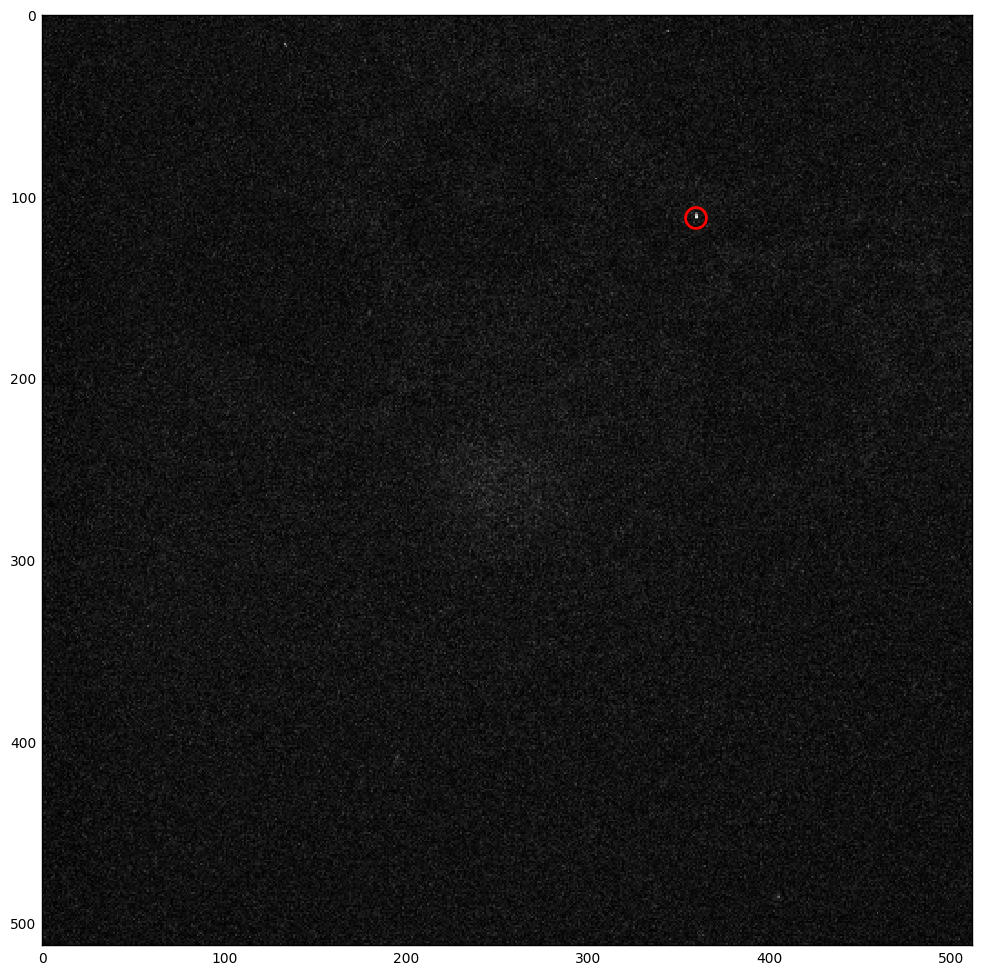

In [11]:
for filename in new_root_filenames:
    frames_0 = pims.TiffStack_libtiff(rootdir + filename + "_C0.tif")
    frames_1 = pims.TiffStack_libtiff(rootdir + filename + "_C1.tif")
    
    print("processing experiment: " + filename)
    n0 = len(frames_0)
    n1 = len(frames_1)
    
    samples_0 = [0, n0//2, n0-2]
    samples_1 = [0, n1//2, n1-2]
    
    for n in samples_0:
        print("frame {0} of {1}, channel 0".format(n, n0))
        try:
            f_0 = tp.locate(frames_0[n], minsize, minmass = minmass, separation = separation)
            tp.annotate(f_0, frames_0[n]);
        except:
            print("failed")
            
    for n in samples_1:
        print("frame {0} of {1}, channel 1".format(n, n0))
        try:
            f_1 = tp.locate(frames_1[n], minsize, minmass = minmass, separation=separation)
            tp.annotate(f_1, frames_1[n]);
        except:
            print("failed")

After visual inspection, we throw out experiments with low contrast.

In [10]:
to_exclude = set(['BATCH3_XPGluWithHkAld_R1',
              'BATCH3_XPHkWithAld_R1', 'BATCH3_XPHkWithAld_R2'])
new_root_filenames = set(root_filenames).difference(to_exclude)
assert len(new_root_filenames) == len(root_filenames) - len(to_exclude)

## Calculating Densities
Here we calculate densities and associated error bars.
Results will be stored as a dictionary whose keys are the root filenames and contains a tuple of lists

In [12]:
from collections import defaultdict

In [13]:
results = defaultdict(lambda: ([], []))

In [14]:
for filename in new_root_filenames:
    frames_0 = pims.TiffStack_libtiff(rootdir + filename + "_C0.tif")
    frames_1 = pims.TiffStack_libtiff(rootdir + filename + "_C1.tif")
    
    print("processing experiment: " + filename)
    
    for index, frame0 in enumerate(frames_0):
        print 'channel 0, frame {}'.format(index) + '\r',
        try:
            f_0 = tp.locate(frame0, minsize, minmass = minmass, separation = separation)
            results[filename][0].append(len(f_0))
        except:
            print("no particles found in frame {0} of channel 0 of experiment ".format(index) + filename)
            results[filename][0].append(0)
            
    for index, frame0 in enumerate(frames_1):
        print 'channel 1, frame {}'.format(index) + '\r',
        try:
            f_0 = tp.locate(frame0, minsize, minmass = minmass, separation = separation)
            results[filename][1].append(len(f_0))
        except:
            print("no particles found in frame {0} of channel 1 of experiment ".format(index) + filename)
            results[filename][1].append(0)
            

processing experiment: BATCH3_XP_R3
processing experiment: BATCH3_XP_R2
processing experiment: BATCH3_XP_R1
processing experiment: BATCH3_XPDGAtpMgcl2WithHkAld_R1
processing experiment: BATCH3_XPDGAtpMgcl2WithHkAld_R3
processing experiment: BATCH3_XPDGAtpMgcl2WithHkAld_R2


In [10]:
import pickle

In [15]:
with open('pickled_results_b3.pk', 'wb') as f:
    pickle.dump(dict(results), f)

NameError: name 'pickle' is not defined

In [97]:
with open('pickled_results.pk', 'rb') as f:
    results = pickle.load(f)

In [16]:
# now we want to aggregate the experiments across repetitions.
results_xp = defaultdict(lambda: ([], []))


In [17]:
results.keys()

['BATCH3_XP_R3',
 'BATCH3_XP_R2',
 'BATCH3_XP_R1',
 'BATCH3_XPDGAtpMgcl2WithHkAld_R1',
 'BATCH3_XPDGAtpMgcl2WithHkAld_R3',
 'BATCH3_XPDGAtpMgcl2WithHkAld_R2']

In [18]:
for k, (c0, c1) in results.items():
    xp_key = k[:-3]
    if xp_key == "BATCH2_XPControl": xp_key = "BATCH2_XP"
    results_xp[xp_key][0].extend(c0)
    results_xp[xp_key][1].extend(c1)

In [21]:
print("Batch : Experiment          : Channel : Mean  : Std Dev : Normal SEM : Poisson SEM")
for k, c in results_xp.items():
    batch_no, XP = k.split('_')
    batch_no = batch_no[5:]
    XP = XP[2:]
    for i, c_i in enumerate(c):
        print('{:5} : {:19} : {:7} : {:5.2f} : {:7.2f} : {:10.2f} : {:5.2f} : {:5}'.format(batch_no,
            XP, i,
                                                                          np.mean(c_i),
                                                                          np.std(c_i, ddof =1),
                                                                          2*np.std(c_i, ddof=1)/np.sqrt(len(c_i)),
                                                                          np.sqrt(np.mean(c_i)/len(c_i)),
                                                                                         len(c_i)))
          

Batch : Experiment          : Channel : Mean  : Std Dev : Normal SEM : Poisson SEM
3     : DGAtpMgcl2WithHkAld :       0 :  2.49 :    2.23 :       0.27 :  0.10 :   269
3     : DGAtpMgcl2WithHkAld :       1 :  1.92 :    2.22 :       0.27 :  0.08 :   269
3     :                     :       0 :  6.24 :    1.78 :       0.14 :  0.10 :   607
3     :                     :       1 :  7.03 :    2.74 :       0.22 :  0.11 :   607


In [25]:
import scipy.stats as stats
import itertools

In [29]:
key1 = results_xp.keys()[0]
key2 = results_xp.keys()[1]

In [33]:
stats.ttest_ind(results_xp[key1][0], results_xp[key2][0]).pvalue * 100

6.7863214910824624e-113

In [20]:

print("Batch : Rep  : Experiment          : Channel : Mean  : Std Dev : Normal SEM : Poisson SEM : N")
 
for k, c in results.items():
    batch_no, XP, rep = k.split('_')
    batch_no = batch_no[5:]
    XP = XP[2:]
    rep = rep[1:]
    for i, c_i in enumerate(c):
        print('{:5} : {:4} : {:19} : {:7} : {:5.2f} : {:7.2f} : {:10.2f} : {:5.2f} : {:5}'.format(batch_no,
                                                                        rep, XP, i,
                                                                          np.mean(c_i),
                                                                          np.std(c_i, ddof =1),
                                                                          np.std(c_i, ddof=1)/np.sqrt(len(c_i)),
                                                                          np.sqrt(np.mean(c_i)/len(c_i)),
                                                                             len(c_i)))
          

Batch : Rep  : Experiment          : Channel : Mean  : Std Dev : Normal SEM : Poisson SEM : N
3     : 3    :                     :       0 :  6.87 :    2.02 :       0.14 :  0.18 :   218
3     : 3    :                     :       1 :  8.88 :    2.50 :       0.17 :  0.20 :   218
3     : 2    :                     :       0 :  5.76 :    1.58 :       0.12 :  0.18 :   179
3     : 2    :                     :       1 :  7.68 :    1.99 :       0.15 :  0.21 :   179
3     : 1    :                     :       0 :  6.00 :    1.45 :       0.10 :  0.17 :   210
3     : 1    :                     :       1 :  4.57 :    1.37 :       0.09 :  0.15 :   210
3     : 1    : DGAtpMgcl2WithHkAld :       0 :  1.58 :    1.20 :       0.10 :  0.11 :   132
3     : 1    : DGAtpMgcl2WithHkAld :       1 :  0.99 :    0.73 :       0.06 :  0.09 :   132
3     : 3    : DGAtpMgcl2WithHkAld :       0 :  5.76 :    2.88 :       0.41 :  0.34 :    49
3     : 3    : DGAtpMgcl2WithHkAld :       1 :  5.69 :    2.63 :       0.38 : 

In [ ]:
# looking at the first frame from Aldolase
tp.annotate(f_1, frames_1[0]);

The results look good for this frame, now let's run this for the video.

In [ ]:
f_0 = tp.batch(frames_0, minsize, minmass=minmass, separation=separation)

In [ ]:
f_1 = tp.batch(frames_1, minsize, minmass=minmass, separation=separation)

## Building trajectories
Same as before, we need to check the parameters to evaluate valid trajectories.

In [ ]:
skiphop = 10 # this is the numner of pixels a particle can jump between frames
mem = 5 # this is the number of frames that a particle can 'disappear' for
stubsize = 10 # the minium number of frames a trajectory has to exist for the trajectory to be considered

In [ ]:
# now we create the trajectories
t_0 = tp.link_df(f_0, skiphop, memory = mem)
t_1 = tp.link_df(f_1, skiphop, memory = mem)

In [ ]:
tl_0 = tp.filter_stubs(t_0, stubsize)
tl_1 = tp.filter_stubs(t_1, stubsize)

In [ ]:
tl_0['particle'].unique()

In [ ]:
# first let's see how many trajectories we are going to have to watch
traj_parts = [i for i in set(tl_0.particle) if len(tl_0[tl_0.particle ==i]) > 10]
len(traj_parts)

### Showing this in graph form
We're happy that it works, now we show this using little graphs that can be put in the suppl!

In [ ]:
nplots = len(traj_parts)

nrows = int(nplots/3) +1
ncols = 3
buff = 10 # 10 for all but 2 for 2x
plt.figure(figsize=(15,40))
for j, part in enumerate(traj_parts):
    ax = plt.subplot(nrows, ncols, j+1)
    x_traj = tl_0[tl_0.particle == part].x
    y_traj = tl_0[tl_0.particle == part].y
    xlims = [np.min(x_traj)-buff, np.max(x_traj)+buff]
    
    ylims = [np.min(y_traj)-buff, np.max(y_traj)+buff]
    framelims = [tl_0[tl_0.particle ==part].iloc[1].frame,
                 tl_0[tl_0.particle ==part].iloc[-1].frame]
    ax.set_xlim(xlims)
    ax.set_ylim(ylims)
    ax.plot(x_traj, y_traj)
    # candidates
    cands = tl_1[(tl_1.frame >= framelims[0]) &
               (tl_1.frame <= framelims[1]) &
               (tl_1.x >= xlims[0]) &
               (tl_1.x <= xlims[1]) &
               (tl_1.y >= ylims[0]) &
               (tl_1.y <= ylims[1])]
    
    for candidate_particle in set(cands.particle):
        cand = cands[cands.particle == candidate_particle]
        ax.plot(cand.x, cand.y, color='red')

plt.savefig("../img/june_data_1.png")
        

# Plotting the size distribution

In [ ]:
fig, ax = plt.subplots(figsize = (9, 6))
ax.hist(f_0['mass'], bins=20);
# this is the appearance at t = 0

In [ ]:
fig, ax = plt.subplots(figsize = (10, 10))
# this is the average appearance over the trajectory
tp.mass_size(tl_0.groupby('particle').mean());

## Iterating over the videos to build a DF.

In [ ]:
import os

In [ ]:
# getting a list of all the base filenames
root_filenames = []

for filename in os.listdir("../stackdata_2/"):
    if not filename.endswith("C=2.tif"):
        root_filenames.append(filename.split('_c')[0])
        
root_filenames = set(root_filenames)

print root_filenames

In [ ]:
# now for each filename, we load a pair of videos
# and run them through everything
aggregate_df = pd.DataFrame()

for root_filename in list(root_filenames):
    print "working on file: " + root_filename + "\n"
    # load files
    frames_0 = pims.TiffStack_libtiff("../stackdata_2/" + root_filename + "_c0.tif")
    frames_1 = pims.TiffStack_libtiff("../stackdata_2/" + root_filename + "_c1.tif")
    
    # setting the parameters
    if "20X" in root_filename:
        minmass = 150
        minsize = 5
        separation = 20
        buff = 2
    else:
        minmass = 60
        minsize = 5
        separation = 20
        buff = 10 # 10 for all but 2 for 2x
    
    # locating the features
    f_0 = tp.batch(frames_0, minsize, minmass=minmass, separation=separation)
    f_1 = tp.batch(frames_1, minsize, minmass=minmass, separation=separation)

    skiphop = 10 # this is the numner of pixels a particle can jump between frames
    mem = 5 # this is the number of frames that a particle can 'disappear' for
    stubsize = 10 # the minium number of frames a trajectory has to exist for the trajectory to be consideredoO

    # linking trajectories
    t_0 = tp.link_df(f_0, skiphop, memory = mem)
    t_1 = tp.link_df(f_1, skiphop, memory = mem)

    tl_0 = tp.filter_stubs(t_0, stubsize)
    tl_1 = tp.filter_stubs(t_1, stubsize)

    # number of trajectories in the frame of interest
    traj_parts = [i for i in set(tl_0.particle) if len(tl_0[tl_0.particle ==i]) > 10]
    
    n_traj = len(traj_parts)
    
    for j, part in enumerate(traj_parts):
        # our main dataframe
        df_0 = tl_0[tl_0.particle == part]
        # this is our 'main' trajectory
        x_traj = df_0.x
        y_traj = df_0.y
        
        # this is the frame around our trajectory
        xlims = [np.min(x_traj)-buff, np.max(x_traj)+buff]
        ylims = [np.min(y_traj)-buff, np.max(y_traj)+buff]
        framelims = [df_0.iloc[1].frame,
                     df_0.iloc[-1].frame]
        
        # candidate data frame
        cands = tl_1[(tl_1.frame >= framelims[0]) &
                   (tl_1.frame <= framelims[1]) &
                   (tl_1.x >= xlims[0]) &
                   (tl_1.x <= xlims[1]) &
                   (tl_1.y >= ylims[0]) &
                   (tl_1.y <= ylims[1])]
        
        # now we find the longest candidate trajectory
        length_traj = 0
        chosen_particle = None
        for candidate_particle in set(cands.particle):
            cand = cands[cands.particle == candidate_particle]
            if len(cand) > length_traj:
                chosen_particle = candidate_particle
                length_traj = len(cand)
                
        df_1 = cands[cands.particle == chosen_particle]
        
        # now we add some name fields and concatenate the things
        df_0['filename'] = root_filename
        df_1['filename'] = root_filename
        df_0['channel'] = 0
        df_1['channel'] = 1
        df_0['pair_id'] = j
        df_1['pair_id'] = j
        
        aggregate_df = pd.concat([aggregate_df, df_0, df_1])
        
            


In [ ]:
aggregate_df.to_csv("../data/trajectory_df_no_iso.csv")

In [ ]:
list(root_filenames)[4:5]
testname = list(set(aggregate_df.filename))[0]
testname

In [ ]:
ha = aggregate_df[aggregate_df.filename == testname] 
ha_0 = ha[ha.channel ==0]
ha_1 = ha[ha.channel == 1]

In [ ]:
pair_id = 0
test_0 = ha_0[ha_0.pair_id == pair_id]
test_1 = ha_1[ha_1.pair_id == pair_id]
fig, ax = plt.subplots()
ax.plot(test_0.x, test_0.y)
ax.plot(test_1.x, test_1.y)

### Mass distribution plot

In [ ]:
df = pd.read_csv("../data/trajectory_df.csv")

In [ ]:
df

In [ ]:
set(df.filename)

In [ ]:
def pos_or_neg(x):
    if x.startswith('with glucose'):
        return 1
    else:
        return 0

In [ ]:
df['pos_or_neg'] = df['filename'].apply(pos_or_neg)

In [ ]:
df

In [ ]:
df['uniqueid'] = df["filename"] + df["pair_id"].map(str) + df['channel'].map(str)

In [ ]:
df2 = df.groupby('uniqueid').mean()

In [ ]:
df2.index

In [ ]:
df2['new_index'] = df2.index.str[:-1]

In [ ]:
df3 = df2.pivot(values = 'mass', index = 'new_index', columns = 'channel').dropna()

In [ ]:
plt.scatter(df3[0], df3[1], alpha = .4)
plt.xlabel('Hexokinase Mass')
plt.ylabel('Aldolase Mass')
#plt.xlim([60,120])
#plt.ylim([0,750])

## Counting Particles

First we need to rebuild a dataframe containing all Aldolase trajectories...

In [ ]:
df = pd.DataFrame()

for root_filename in list(root_filenames):
    print "working on file: " + root_filename + "\n"
    # load files
    frames_0 = pims.TiffStack("../stackdata/" + root_filename + " - C=0.tif")
    frames_1 = pims.TiffStack("../stackdata/" + root_filename + " - C=1.tif")
    
    # setting the parameters
    if "20X" in root_filename:
        minmass = 150
        minsize = 5
        separation = 20
        buff = 2
    else:
        minmass = 60
        minsize = 5
        separation = 20
        buff = 10 # 10 for all but 2 for 2x
    
    # locating the features
    f_0 = tp.batch(frames_0, minsize, minmass=minmass, separation=separation)
    f_1 = tp.batch(frames_1, minsize, minmass=minmass, separation=separation)

    skiphop = 10 # this is the numner of pixels a particle can jump between frames
    mem = 5 # this is the number of frames that a particle can 'disappear' for
    stubsize = 10 # the minium number of frames a trajectory has to exist for the trajectory to be consideredoO

    # linking trajectories
    t_0 = tp.link_df(f_0, skiphop, memory = mem)
    t_1 = tp.link_df(f_1, skiphop, memory = mem)

    tl_0 = tp.filter_stubs(t_0, stubsize)
    tl_1 = tp.filter_stubs(t_1, stubsize)

    tl_0['filename'] = root_filename
    tl_1['filename'] = root_filename
    tl_0['channel'] = 0
    tl_1['channel'] = 1

    df = pd.concat([df, tl_0, tl_1])

In [ ]:
ha = df.groupby(['channel', 'filename'])['particle'].unique()

In [ ]:
traj_count_0 = [len(set(elem)) for elem in ha[0]]
traj_count_1 = [len(set(elem)) for elem in ha[1]]

In [ ]:
dict(zip(ha[0].index, traj_count_0))

In [ ]:
dict(zip(ha[1].index, traj_count_1))

In [ ]:
15+2+20+1+19

In [ ]:
52+195+68

In [ ]:
90+86+184+398+448

In [ ]:
df = df[df['filename'] == "with glucose with 20X objective"]

In [ ]:
df = df[df['channel'] == 0]

In [ ]:
set(df['particle'])

In [ ]:
df